In [1]:
import stim
import pymatching
import numpy as np
import sinter
from typing import List
import matplotlib.pyplot as plt

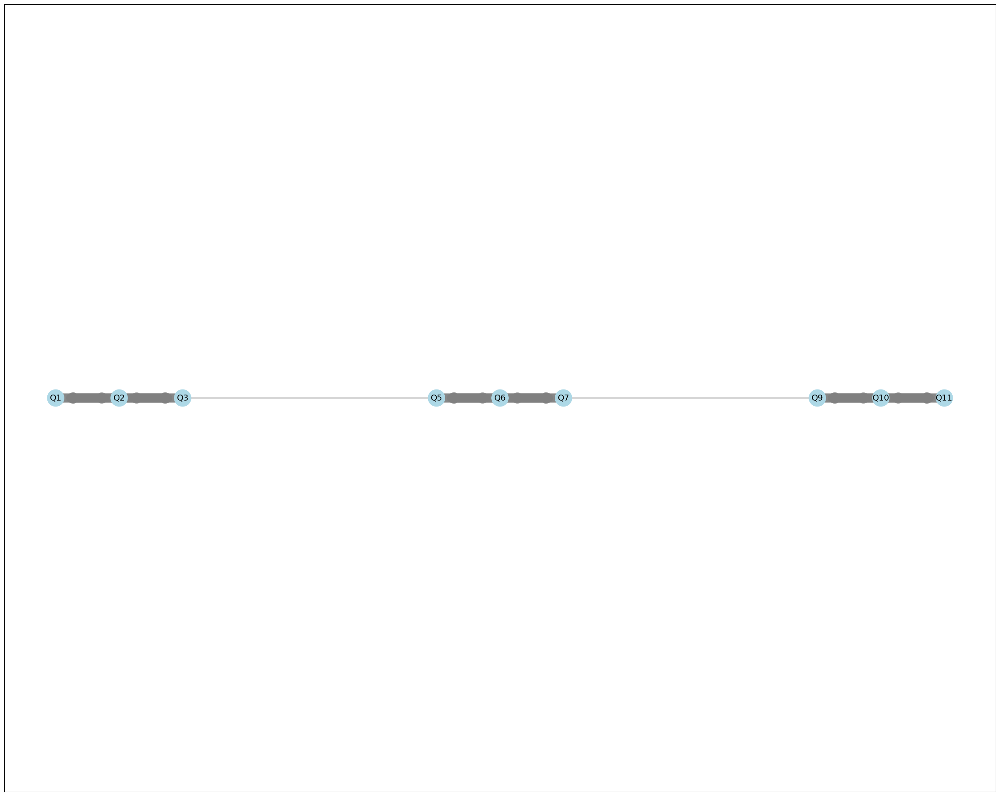

In [2]:
from src.utils.qccd_arch import *

# Create architecture
arch = QCCDArch()

ionspacing = 5
trapspacing = 30
cooling_colour = 'red'
qubit_colour = 'lightblue'
traps = []

for i in range(3):
    ions = [QubitIon(qubit_colour, 'Q'), QubitIon(qubit_colour, 'Q'), QubitIon(qubit_colour, 'Q')]
    trap = arch.addManipulationTrap(x=i *trapspacing, y=0, ions=ions, color='grey', spacing=ionspacing, isHorizontal=True)
    traps.append(trap)

for t1, t2 in zip(traps[:-1], traps[1:]):
    arch.addEdge(t1, t2)

arch.refreshGraph()
fig, ax = plt.subplots()
# Display architecture
arch.display(fig,ax, showLabels=False)





In [6]:
from src.utils.qccd_arch import *
from src.compiler.qccd_parallelisation import *

# Create architecture
arch = QCCDArch()

ionspacing = 1
trapspacing = 6
qubit_colour = 'red'
qubit_colour = 'lightblue'
junction_colour = 'orange'
traps = []

ManipulationTrap.DEFAULT_SPACING = trapspacing
arch.SIZING = 0.5
ions11 = [QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q'), QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q')]
trap11 = arch.addManipulationTrap(x=0, y=0, ions=ions11, color='grey', spacing=ionspacing, isHorizontal=False)

ions12 = [QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q'), QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q')]
trap12 = arch.addManipulationTrap(x=trapspacing, y=0, ions=ions12, color='grey', spacing=ionspacing, isHorizontal=False)

junctionL = arch.addJunction(x=0, y=trapspacing, color=junction_colour)
junctionR = arch.addJunction(x=trapspacing, y=trapspacing, color=junction_colour)

ions21 = [QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q'), QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q')]
trap21 = arch.addManipulationTrap(x=0, y=2*trapspacing, ions=ions21, color='grey', spacing=ionspacing, isHorizontal=False)

ions22 = [QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q'), QubitIon(qubit_colour, 'Q'), CoolingIon(qubit_colour, 'Q')]
trap22 = arch.addManipulationTrap(x=trapspacing, y=2*trapspacing, ions=ions22, color='grey', spacing=ionspacing, isHorizontal=False)

crossing11 = arch.addEdge(trap11, junctionL)
arch.addEdge(trap12, junctionR)
crossing21 = arch.addEdge(trap21, junctionL)
arch.addEdge(trap22, junctionR)
arch.addEdge(junctionL, junctionR)

arch.refreshGraph()
# Display architecture


ops = (
    Split.physicalOperation(trap11, crossing11), 
    Move.physicalOperation(crossing11),
    JunctionCrossing.physicalOperation(junctionL, crossing11),
    JunctionCrossing.physicalOperation(junctionL, crossing21),
    Move.physicalOperation(crossing21),
    Merge.physicalOperation(trap21, crossing21),
    GateSwap.physicalOperation(trap=trap21, ion1=ions21[0], ion2=ions21[2]),
    TwoQubitMSGate.physicalOperation(ion1=ions22[0], ion2=ions22[2],trap=trap22),
    OneQubitGate.physicalOperation(ion=ions12[0], trap=trap12),
    Measurement.physicalOperation(ion=ions12[0], trap=trap12),
    QubitReset.physicalOperation(ion=ions12[0],trap=trap12))
parallelOps = paralleliseOperationsSimple(ops)





QUBIT_RESET[24]
QUBIT_RESET[15]
QUBIT_RESET[28]
QUBIT_RESET[17]
QUBIT_RESET[35]
QUBIT_RESET[38]
QUBIT_RESET[41]
QUBIT_RESET[54]
QUBIT_RESET[47]
QUBIT_RESET[63]
QUBIT_RESET[50]
QUBIT_RESET[51]
QUBIT_RESET[59]
QUBIT_RESET[60]
QUBIT_RESET[66]
QUBIT_RESET[67]
QUBIT_RESET[22]
QUBIT_RESET[26]
QUBIT_RESET[23]
QUBIT_RESET[14]
QUBIT_RESET[27]
QUBIT_RESET[33]
QUBIT_RESET[34]
QUBIT_RESET[37]
QUBIT_RESET[40]
QUBIT_RESET[53]
QUBIT_RESET[46]
QUBIT_RESET[62]
QUBIT_RESET[49]
QUBIT_RESET[58]
QUBIT_RESET[65]
RY[22]
RX[22]
RY[26]
RX[26]
RY[14]
RX[14]
RY[34]
RX[34]
RY[40]
RX[40]
RY[62]
RX[62]
RY[58]
RX[58]
RY[65]
RX[65]
RY[22]
RX[22]
RX[15]
TWO_QUBIT_MS_GATE[22, 15]
RY[22]
RY[34]
RX[34]
RX[63]
TWO_QUBIT_MS_GATE[34, 63]
RY[34]
RY[14]
RX[14]
RX[41]
TWO_QUBIT_MS_GATE[14, 41]
RY[14]
RY[62]
RX[62]
RX[66]
TWO_QUBIT_MS_GATE[62, 66]
RY[62]
RY[26]
RX[26]
RX[17]
TWO_QUBIT_MS_GATE[26, 17]
RY[26]
RY[40]
RX[40]
RX[51]
TWO_QUBIT_MS_GATE[40, 51]
RY[40]
RY[47]
RX[47]
RX[33]
TWO_QUBIT_MS_GATE[47, 33]
RY[47]
RY[38]
RX[38]


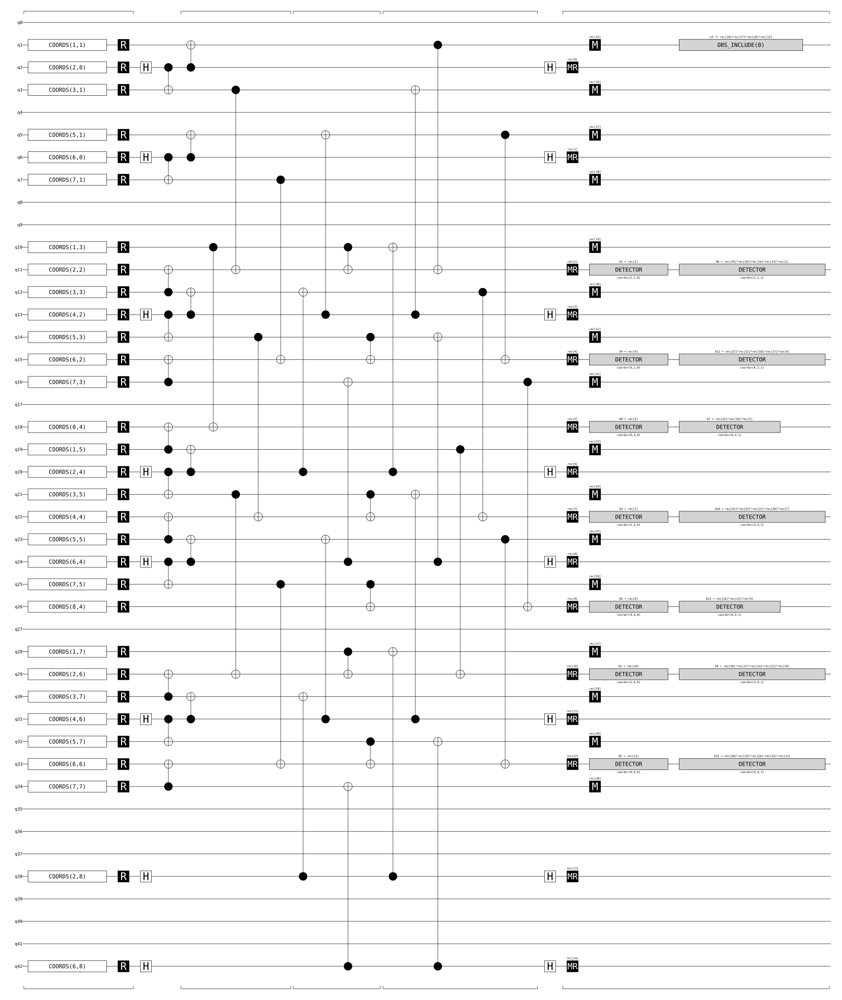

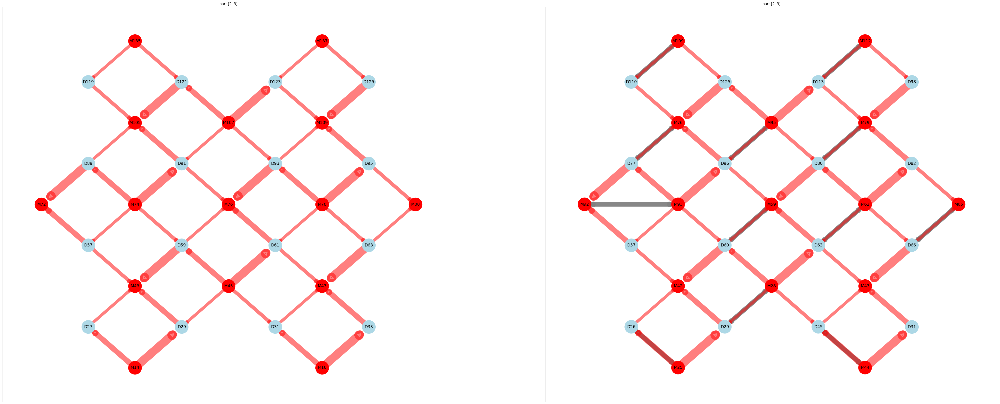

In [16]:
from src.simulator.qccd_circuit import *

noise = 1e-3
d=4
    
circuit = QCCDCircuit.generated(
    "surface_code:rotated_memory_z",
    rounds=1,
    distance=d,
    after_clifford_depolarization=noise,
    after_reset_flip_probability=noise,
    before_measure_flip_probability=noise,
    before_round_data_depolarization=noise,
)


rows = 4
cols = 4
capacity = 4

arch, (instructions,_) = circuit.processCircuitAugmentedGrid(rows=rows, cols=cols, trapCapacity=capacity)

for i in instructions:
    print(i.label+str([ion.idx for ion in i.ions]))

_capacities = [2,3]
rows = 10
cols = 10

label='part'
fig, axs = plt.subplots(1, len(_capacities))
for ax, capacity in zip(axs, _capacities):
    arch1, (instructions,_) = circuit.processCircuitAugmentedGrid(rows=rows, cols=cols, trapCapacity=capacity)
    arch1.ION_SIZE = 2000

    for idx, (ion, pos) in circuit._ionMapping.items():
        ion.set(ion.idx, pos[0], pos[1])

    arch1.refreshGraph()
    edgesDups = []
    edgesPos = []
    ionsInvolved = set()
    score = 0
    for op in instructions:
        if not isinstance(op, TwoQubitMSGate):
            continue
        if not ionsInvolved.isdisjoint(op.ions):
            score+=1
            ionsInvolved=set()
        edgesDups.append((op.ions, score))
        edgesPos.append((op.ionsActedIdxs, score))
        ionsInvolved=ionsInvolved.union(op.ions)
    scores = [score for ((ion1,ion2), score) in edgesDups]
    color_from_score = {s: (5+i*i)*2 for i, s in enumerate( sorted(list(set(scores)), reverse=True))}
    arch1._manipulationTraps.append(([(ion1.idx, ion2.idx) for ((ion1,ion2), score) in edgesDups], [color_from_score[score] for ((ion1,ion2), score) in edgesDups]))
    arch1.display(fig, ax, showLabels=False, showEdges=False, show_junction=False)
    ax.set_title(f"{label} {_capacities}")


circuit.without_noise().diagram('timeline-svg')

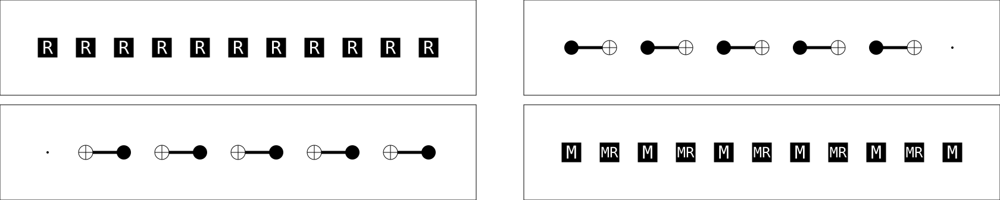

In [55]:
from src.simulator.qccd_circuit import *

noise=0.01
distance =6
circuit = QCCDCircuit()
for i in range(2*distance-1):
    circuit+=QCCDCircuit(f"QUBIT_COORDS({i},0) {i}")
circuit += QCCDCircuit.generated(
    "repetition_code:memory",
    rounds=1,
    distance=distance,
    after_clifford_depolarization=noise,
    after_reset_flip_probability=noise,
    before_measure_flip_probability=noise,
    before_round_data_depolarization=noise,
)
circuit.without_noise().diagram('timeslice-svg')


In [3]:
from src.simulator.qccd_circuit import *

noise=0.01
distance =3
circuit = QCCDCircuit()
for i in range(2*distance-1):
    circuit+=QCCDCircuit(f"QUBIT_COORDS({i},0) {i}")
circuit += QCCDCircuit.generated(
    "repetition_code:memory",
    rounds=1,
    distance=distance,
    after_clifford_depolarization=noise,
    after_reset_flip_probability=noise,
    before_measure_flip_probability=noise,
    before_round_data_depolarization=noise,
)
circuit.without_noise().diagram('timeslice-svg')
circuit

stim.Circuit('''
    QUBIT_COORDS(0, 0) 0
    QUBIT_COORDS(1, 0) 1
    QUBIT_COORDS(2, 0) 2
    QUBIT_COORDS(3, 0) 3
    QUBIT_COORDS(4, 0) 4
    R 0 1 2 3 4
    X_ERROR(0.01) 0 1 2 3 4
    TICK
    DEPOLARIZE1(0.01) 0 2 4
    CX 0 1 2 3
    DEPOLARIZE2(0.01) 0 1 2 3
    TICK
    CX 2 1 4 3
    DEPOLARIZE2(0.01) 2 1 4 3
    TICK
    X_ERROR(0.01) 1 3
    MR 1 3
    X_ERROR(0.01) 1 3
    DETECTOR(1, 0) rec[-2]
    DETECTOR(3, 0) rec[-1]
    X_ERROR(0.01) 0 2 4
    M 0 2 4
    DETECTOR(1, 1) rec[-2] rec[-3] rec[-5]
    DETECTOR(3, 1) rec[-1] rec[-2] rec[-4]
    OBSERVABLE_INCLUDE(0) rec[-1]
''')

total number of routing operations: 0
total number of operations: 77
time for operations: 5400.0
num gate swaps: 0
num splits: 0


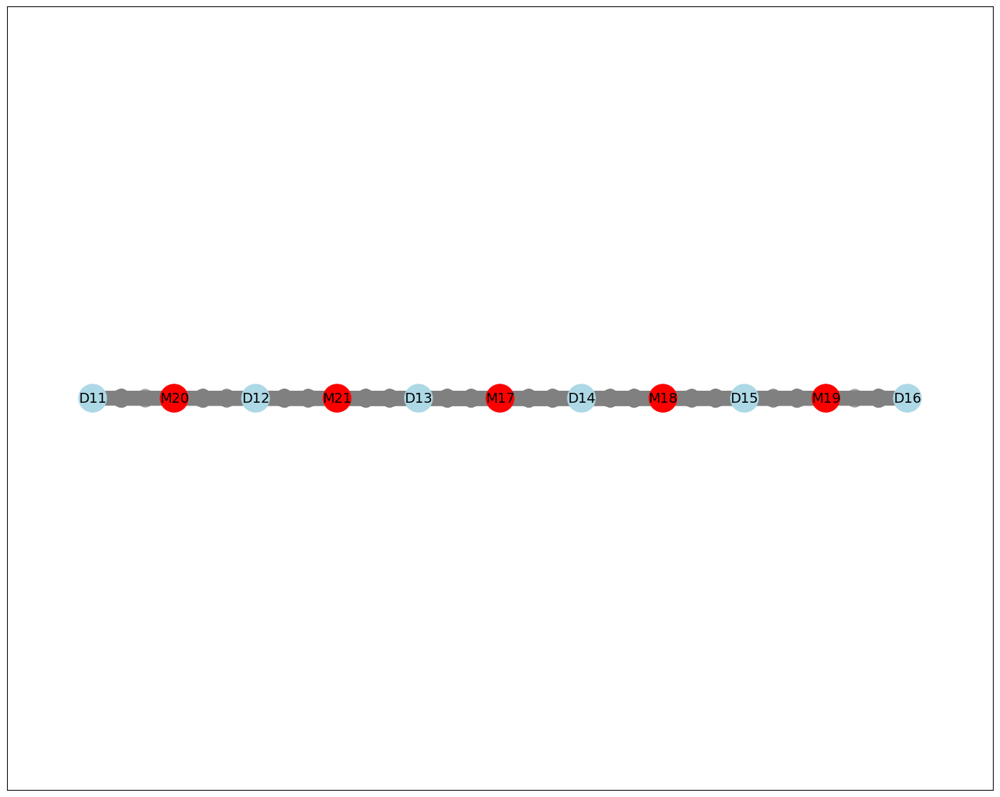

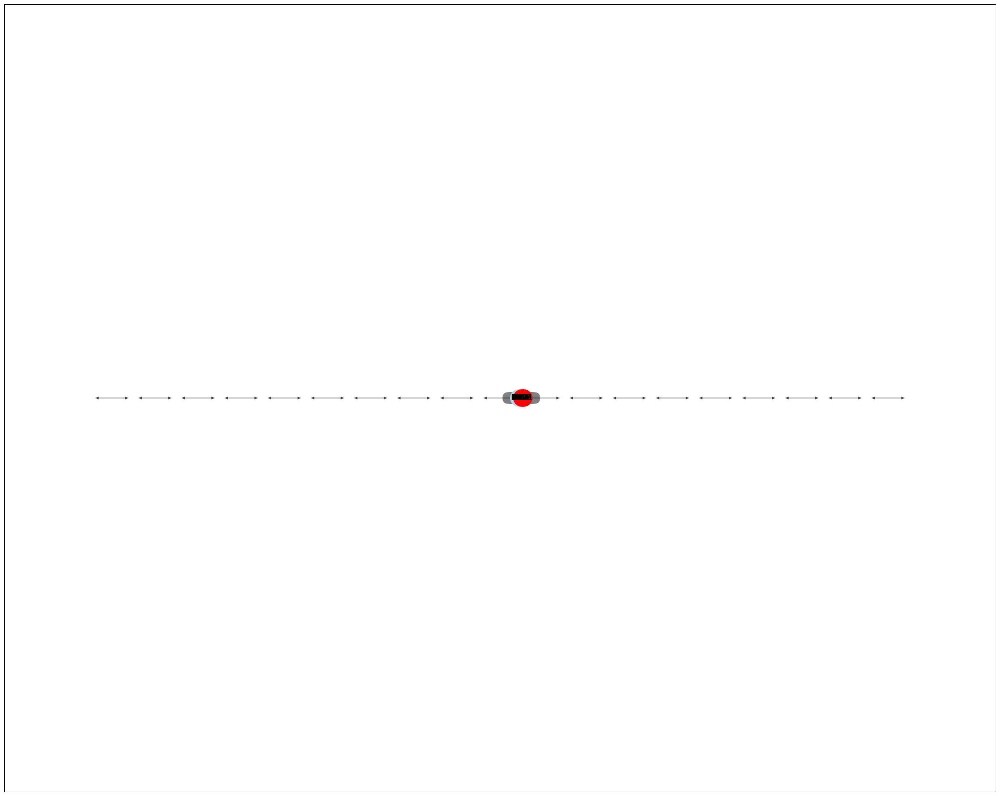

In [11]:
from src.simulator.qccd_circuit import *

noise=0.01
rounds=1
distance =6
trapCapacity=20
rows=1
cols=20

circuit = QCCDCircuit()
for i in range(2*distance-1):
    circuit+=QCCDCircuit(f"QUBIT_COORDS({i},0) {i}")
circuit += QCCDCircuit.generated(
    "repetition_code:memory",
    rounds=rounds,
    distance=distance,
    after_clifford_depolarization=noise,
    after_reset_flip_probability=noise,
    before_measure_flip_probability=noise,
    before_round_data_depolarization=noise,
)
circuit.without_noise().diagram('timeslice-svg')

from src.simulator.qccd_circuit import *
from src.compiler.qccd_ion_routing import *



arch, (instructions,_) = circuit.processCircuitAugmentedGrid(rows=rows, cols=cols, trapCapacity=trapCapacity, padding=0)

oldPositions = {}
for idx, (ion, pos) in circuit._ionMapping.items():
    oldPositions[idx] = ion.pos
    ion.set(ion.idx, pos[0], pos[1], parent=ion.parent)

fig,ax =plt.subplots()
arch1 = arch
arch1.refreshGraph()
edgesDups = []
edgesPos = []
ionsInvolved = set()
score = 0
for op in instructions:
    if not isinstance(op, TwoQubitMSGate):
        continue
    if not ionsInvolved.isdisjoint(op.ions):
        score+=1
        ionsInvolved=set()
    edgesDups.append((op.ions, score))
    edgesPos.append((op.ionsActedIdxs, score))
    ionsInvolved=ionsInvolved.union(op.ions)
scores = [score for ((ion1,ion2), score) in edgesDups]
color_from_score = {s: (5+i*i)*0 for i, s in enumerate( sorted(list(set(scores)), reverse=True))}
arch1._manipulationTraps.append(([(ion1.idx, ion2.idx) for ((ion1,ion2), score) in edgesDups], [color_from_score[score] for ((ion1,ion2), score) in edgesDups]))
arch1.display(fig, ax, showLabels=False, showEdges=False, show_junction=False)
fig.set_size_inches(arch.WINDOW_SIZE[0]*0.6, arch.WINDOW_SIZE[1]*0.6)
arch1._manipulationTraps = arch1._manipulationTraps[:-1]
for idx, (ion, pos) in circuit._ionMapping.items():
    ion.set(ion.idx, oldPositions[idx][0], oldPositions[idx][1], parent=ion.parent)


arch.refreshGraph()

fig,ax =plt.subplots()
arch.display(fig, ax, showLabels=False)
fig.set_size_inches(arch.WINDOW_SIZE[0], arch.WINDOW_SIZE[1])

allOps, barriers = ionRouting(arch, instructions, trapCapacity=trapCapacity)
parallelOpsMap = paralleliseOperationsWithBarriers(allOps, barriers)
parallelOps = list(dict(parallelOpsMap).values())


numSplits = sum(1 for instr in allOps if isinstance(instr, Split))
numGateSwaps = sum(1 for instr in allOps if isinstance(instr, GateSwap))

print(f"total number of routing operations: {len(allOps)-len(instructions)}")
print(f"total number of operations: {len(allOps)}")
print(f"time for operations: {max(parallelOpsMap.keys())*1e6}")
print(f"num gate swaps: {numGateSwaps}")
print(f"num splits: {numSplits}")


# plt.close('all')


total number of routing operations: 6336
total number of operations: 9981
time for operations: 4085.000000000001
num gate swaps: 0
num splits: 1056


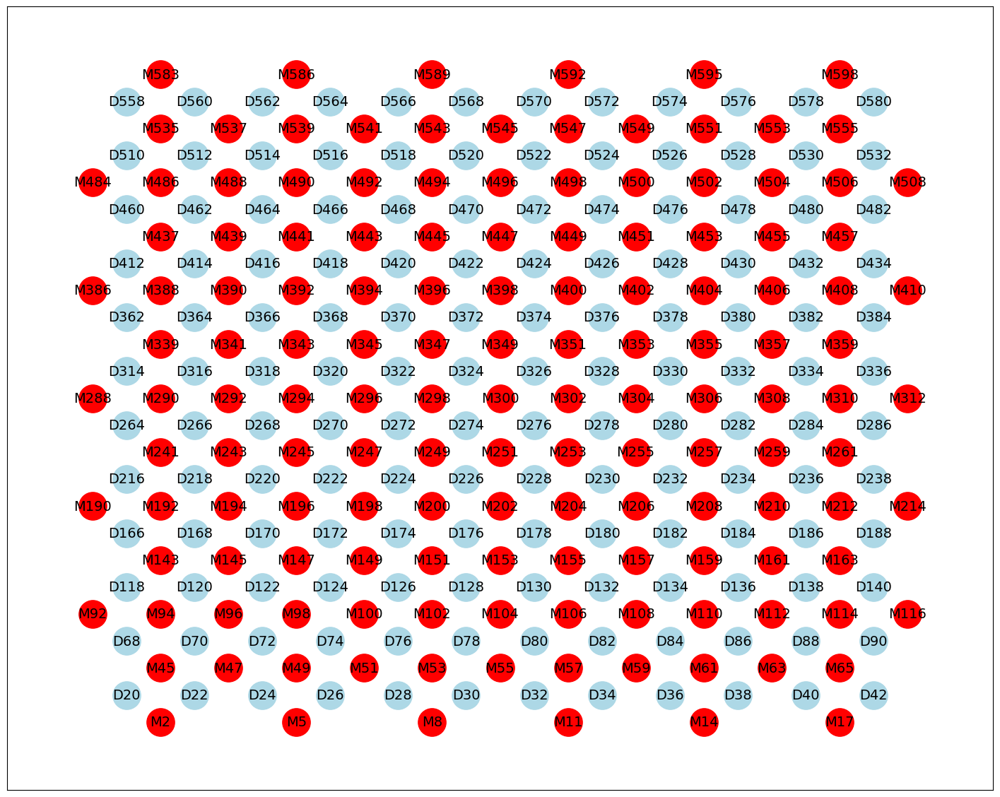

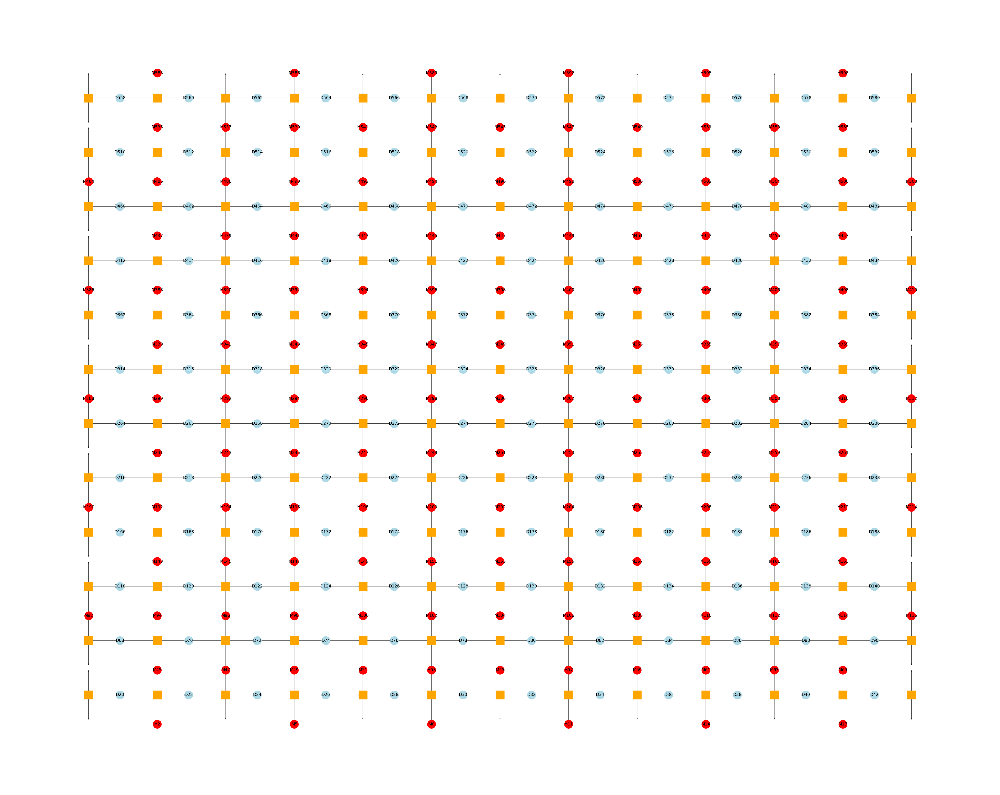

In [21]:
from src.simulator.qccd_circuit import *

noise=0.01
rounds=1
distance=12
trapCapacity=2
rows=13
cols=13

circuit = QCCDCircuit.generated(
    "surface_code:rotated_memory_z",
    rounds=rounds,
    distance=distance,
    after_clifford_depolarization=noise,
    after_reset_flip_probability=noise,
    before_measure_flip_probability=noise,
    before_round_data_depolarization=noise,
)
circuit.without_noise().diagram('timeslice-svg')

from src.simulator.qccd_circuit import *
from src.compiler.qccd_ion_routing import *


arch, (instructions,_) = circuit.processCircuitAugmentedGrid(rows=rows, cols=cols, trapCapacity=trapCapacity, padding=0)
# arch, (instructions,_) = circuit.processCircuitNetworkedGrid(traps=20, trapCapacity=trapCapacity)

oldPositions = {}
for idx, (ion, pos) in circuit._ionMapping.items():
    oldPositions[idx] = ion.pos
    ion.set(ion.idx, pos[0], pos[1], parent=ion.parent)

fig,ax =plt.subplots()
arch1 = arch
arch1.refreshGraph()
edgesDups = []
edgesPos = []
ionsInvolved = set()
score = 0
for op in instructions:
    if not isinstance(op, TwoQubitMSGate):
        continue
    if not ionsInvolved.isdisjoint(op.ions):
        score+=1
        ionsInvolved=set()
    edgesDups.append((op.ions, score))
    edgesPos.append((op.ionsActedIdxs, score))
    ionsInvolved=ionsInvolved.union(op.ions)
scores = [score for ((ion1,ion2), score) in edgesDups]
color_from_score = {s: (5+i*i)*0 for i, s in enumerate( sorted(list(set(scores)), reverse=True))}
arch1._manipulationTraps.append(([(ion1.idx, ion2.idx) for ((ion1,ion2), score) in edgesDups], [color_from_score[score] for ((ion1,ion2), score) in edgesDups]))
arch1.display(fig, ax, showLabels=False, showEdges=False, show_junction=False)
fig.set_size_inches(arch.WINDOW_SIZE[0]*0.6, arch.WINDOW_SIZE[1]*0.6)
arch1._manipulationTraps = arch1._manipulationTraps[:-1]
for idx, (ion, pos) in circuit._ionMapping.items():
    ion.set(ion.idx, oldPositions[idx][0], oldPositions[idx][1], parent=ion.parent)


arch.refreshGraph()

fig,ax =plt.subplots()
arch.display(fig, ax, showLabels=False)
fig.set_size_inches(arch.WINDOW_SIZE[0]*2, arch.WINDOW_SIZE[1]*2)

allOps, barriers = ionRouting(arch, instructions, trapCapacity=trapCapacity)
parallelOpsMap = paralleliseOperationsWithBarriers(allOps, barriers)
parallelOps = list(dict(parallelOpsMap).values())


print(f"total number of routing operations: {len(allOps)-len(instructions)}")
print(f"total number of operations: {len(allOps)}")
print(f"time for operations: {max(parallelOpsMap.keys())*1e6}")
numSplits = sum(1 for instr in allOps if isinstance(instr, Split))
numGateSwaps = sum(1 for instr in allOps if isinstance(instr, GateSwap))
print(f"num gate swaps: {numGateSwaps}")
print(f"num splits: {numSplits}")

# plt.close('all')

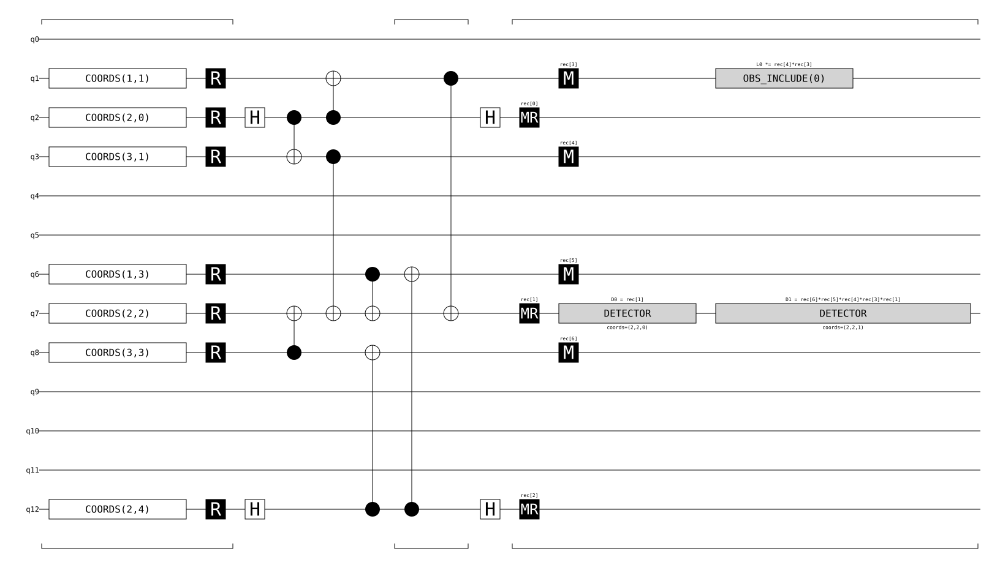

In [ ]:
from src.simulator.qccd_circuit import *

noise=0.01
circuit = QCCDCircuit.generated(
    "surface_code:rotated_memory_z",
    rounds=1,
    distance=2,
    after_clifford_depolarization=noise,
    after_reset_flip_probability=noise,
    before_measure_flip_probability=noise,
    before_round_data_depolarization=noise,
)
circuit.without_noise().diagram('timeline-svg')

In [ ]:
{
  "cols": [
    [
      1,
      "H",
      1,
      1,
      1,
      "H"
    ],
    [
      1,
      1,
      1,
      1,
      "X",
      1,
      "•"
    ],
    [
      1,
      "•",
      "X"
    ],
    [
      1,
      1,
      "•",
      1,
      "X"
    ],
    [
      "X",
      "•"
    ],
    [
      1,
      1,
      1,
      "•",
      "X"
    ],
    [
      "•",
      1,
      1,
      1,
      "X"
    ],
    [
      1,
      1,
      1,
      1,
      1,
      "•",
      "X"
    ],
    [
      1,
      1,
      1,
      "X",
      1,
      "•"
    ],
    [
      1,
      "H",
      1,
      1,
      1,
      "H"
    ]
  ],
  "gates": [
    {
      "id": "~8g3p",
      "name": "MS",
      "circuit": {
        "cols": [
          [
            "•",
            "X"
          ]
        ]
      }
    },
    {
      "id": "~v117",
      "name": "SPLIT",
      "circuit": {
        "cols": [
          [
            "H",
            "H"
          ],
          [
            "H",
            "H"
          ]
        ]
      }
    },
    {
      "id": "~tv6a",
      "name": "MERGE",
      "circuit": {
        "cols": [
          [
            "H",
            "H"
          ],
          [
            "H",
            "H"
          ]
        ]
      }
    },
    {
      "id": "~3qk9",
      "name": "CROSSING",
      "circuit": {
        "cols": [
          [
            "H",
            "H"
          ],
          [
            "H",
            "H"
          ]
        ]
      }
    },
    {
      "id": "~57d0",
      "name": "CROSS",
      "circuit": {
        "cols": [
          [
            "H",
            "H"
          ],
          [
            "H",
            "H"
          ]
        ]
      }
    },
    {
      "id": "~5not",
      "name": "RX",
      "matrix": "{{0.9238795-0.2705981i,-0.2705981i},{-0.2705981i,0.9238795+0.2705981i}}"
    },
    {
      "id": "~ttm1",
      "name": "RY",
      "matrix": "{{0.9238795-0.2705981i,-0.2705981i},{-0.2705981i,0.9238795+0.2705981i}}"
    },
    {
      "id": "~4m58",
      "name": "MOVE",
      "matrix": "{{0.9238795-0.2705981i,-0.2705981i},{-0.2705981i,0.9238795+0.2705981i}}"
    }
  ]
}

In [13]:
https://algassert.com/quirk#circuit=%7B%22cols%22%3A%5B%5B1%2C%22H%22%2C1%2C1%2C1%2C%22H%22%5D%2C%5B1%2C1%2C1%2C1%2C%22X%22%2C1%2C%22%E2%80%A2%22%5D%2C%5B1%2C%22%E2%80%A2%22%2C%22X%22%5D%2C%5B1%2C1%2C%22%E2%80%A2%22%2C1%2C%22X%22%5D%2C%5B%22X%22%2C%22%E2%80%A2%22%5D%2C%5B1%2C1%2C1%2C%22%E2%80%A2%22%2C%22X%22%5D%2C%5B%22%E2%80%A2%22%2C1%2C1%2C1%2C%22X%22%5D%2C%5B1%2C1%2C1%2C1%2C1%2C%22%E2%80%A2%22%2C%22X%22%5D%2C%5B1%2C1%2C1%2C%22X%22%2C1%2C%22%E2%80%A2%22%5D%2C%5B1%2C%22H%22%2C1%2C1%2C1%2C%22H%22%5D%5D%2C%22gates%22%3A%5B%7B%22id%22%3A%22~8g3p%22%2C%22name%22%3A%22MS%22%2C%22circuit%22%3A%7B%22cols%22%3A%5B%5B%22%E2%80%A2%22%2C%22X%22%5D%5D%7D%7D%2C%7B%22id%22%3A%22~v117%22%2C%22name%22%3A%22SPLIT%22%2C%22circuit%22%3A%7B%22cols%22%3A%5B%5B%22H%22%2C%22H%22%5D%2C%5B%22H%22%2C%22H%22%5D%5D%7D%7D%2C%7B%22id%22%3A%22~tv6a%22%2C%22name%22%3A%22MERGE%22%2C%22circuit%22%3A%7B%22cols%22%3A%5B%5B%22H%22%2C%22H%22%5D%2C%5B%22H%22%2C%22H%22%5D%5D%7D%7D%2C%7B%22id%22%3A%22~3qk9%22%2C%22name%22%3A%22CROSSING%22%2C%22circuit%22%3A%7B%22cols%22%3A%5B%5B%22H%22%2C%22H%22%5D%2C%5B%22H%22%2C%22H%22%5D%5D%7D%7D%2C%7B%22id%22%3A%22~57d0%22%2C%22name%22%3A%22CROSS%22%2C%22circuit%22%3A%7B%22cols%22%3A%5B%5B%22H%22%2C%22H%22%5D%2C%5B%22H%22%2C%22H%22%5D%5D%7D%7D%2C%7B%22id%22%3A%22~5not%22%2C%22name%22%3A%22RX%22%2C%22matrix%22%3A%22%7B%7B0.9238795-0.2705981i%2C-0.2705981i%7D%2C%7B-0.2705981i%2C0.9238795%2B0.2705981i%7D%7D%22%7D%2C%7B%22id%22%3A%22~ttm1%22%2C%22name%22%3A%22RY%22%2C%22matrix%22%3A%22%7B%7B0.9238795-0.2705981i%2C-0.2705981i%7D%2C%7B-0.2705981i%2C0.9238795%2B0.2705981i%7D%7D%22%7D%2C%7B%22id%22%3A%22~4m58%22%2C%22name%22%3A%22MOVE%22%2C%22matrix%22%3A%22%7B%7B0.9238795-0.2705981i%2C-0.2705981i%7D%2C%7B-0.2705981i%2C0.9238795%2B0.2705981i%7D%7D%22%7D%5D%7D

SyntaxError: invalid syntax (80236502.py, line 1)

In [ ]:
https://algassert.com/quirk#circuit=%7B%22cols%22%3A%5B%5B1%2C%22~ttm1%22%2C1%2C1%2C1%2C%22~ttm1%22%5D%2C%5B1%2C%22~5not%22%2C1%2C1%2C1%2C%22~5not%22%5D%2C%5B1%2C1%2C1%2C1%2C1%2C%22%3C%3C2%22%5D%2C%5B1%2C%22~ttm1%22%2C1%2C1%2C1%2C%22~ttm1%22%5D%2C%5B1%2C%22~8g3p%22%2C1%2C1%2C%22~8g3p%22%5D%2C%5B1%2C%22~ttm1%22%2C%22~5not%22%2C1%2C%22~5not%22%2C%22~ttm1%22%5D%2C%5B1%2C%22~5not%22%2C1%2C1%2C1%2C%22~5not%22%5D%2C%5B1%2C1%2C1%2C1%2C1%2C%22%3E%3E2%22%5D%2C%5B1%2C1%2C%22%3C%3C2%22%5D%2C%5B1%2C%22~ttm1%22%2C1%2C%22~ttm1%22%5D%2C%5B%22~8g3p%22%2C1%2C1%2C%22~8g3p%22%5D%2C%5B%22~5not%22%2C%22~ttm1%22%2C1%2C%22~ttm1%22%2C%22~5not%22%5D%2C%5B1%2C%22~5not%22%2C1%2C%22~5not%22%5D%2C%5B1%2C1%2C%22%3C%3C2%22%5D%2C%5B1%2C1%2C1%2C%22~ttm1%22%2C1%2C%22~ttm1%22%5D%2C%5B1%2C1%2C1%2C%22~8g3p%22%2C1%2C%22~8g3p%22%5D%2C%5B1%2C1%2C1%2C%22~ttm1%22%2C%22~5not%22%2C%22~ttm1%22%2C%22~5not%22%5D%2C%5B1%2C1%2C1%2C%22~5not%22%2C1%2C%22~5not%22%5D%2C%5B%22%3E%3E3%22%2C1%2C1%2C%22%3C%3C2%22%5D%2C%5B1%2C1%2C%22~ttm1%22%2C1%2C1%2C%22~ttm1%22%5D%2C%5B1%2C1%2C%22~8g3p%22%2C1%2C%22~8g3p%22%5D%2C%5B1%2C1%2C%22~ttm1%22%2C%22~5not%22%2C%22~5not%22%2C%22~ttm1%22%5D%2C%5B1%2C1%2C%22~5not%22%2C1%2C1%2C%22~5not%22%5D%2C%5B%22%3C%3C3%22%2C1%2C1%2C%22%3C%3C2%22%5D%2C%5B1%2C%22~ttm1%22%2C1%2C1%2C1%2C%22~ttm1%22%5D%2C%5B1%2C%22~5not%22%2C1%2C1%2C1%2C%22~5not%22%5D%5D%2C%22gates%22%3A%5B%7B%22id%22%3A%22~8g3p%22%2C%22name%22%3A%22MS%22%2C%22circuit%22%3A%7B%22cols%22%3A%5B%5B%22%E2%80%A2%22%2C%22X%22%5D%5D%7D%7D%2C%7B%22id%22%3A%22~v117%22%2C%22name%22%3A%22SPLIT%22%2C%22circuit%22%3A%7B%22cols%22%3A%5B%5B%22H%22%2C%22H%22%5D%2C%5B%22H%22%2C%22H%22%5D%5D%7D%7D%2C%7B%22id%22%3A%22~tv6a%22%2C%22name%22%3A%22MERGE%22%2C%22circuit%22%3A%7B%22cols%22%3A%5B%5B%22H%22%2C%22H%22%5D%2C%5B%22H%22%2C%22H%22%5D%5D%7D%7D%2C%7B%22id%22%3A%22~3qk9%22%2C%22name%22%3A%22CROSSING%22%2C%22circuit%22%3A%7B%22cols%22%3A%5B%5B%22H%22%2C%22H%22%5D%2C%5B%22H%22%2C%22H%22%5D%5D%7D%7D%2C%7B%22id%22%3A%22~57d0%22%2C%22name%22%3A%22CROSS%22%2C%22circuit%22%3A%7B%22cols%22%3A%5B%5B%22H%22%2C%22H%22%5D%2C%5B%22H%22%2C%22H%22%5D%5D%7D%7D%2C%7B%22id%22%3A%22~5not%22%2C%22name%22%3A%22RX%22%2C%22matrix%22%3A%22%7B%7B0.9238795-0.2705981i%2C-0.2705981i%7D%2C%7B-0.2705981i%2C0.9238795%2B0.2705981i%7D%7D%22%7D%2C%7B%22id%22%3A%22~ttm1%22%2C%22name%22%3A%22RY%22%2C%22matrix%22%3A%22%7B%7B0.9238795-0.2705981i%2C-0.2705981i%7D%2C%7B-0.2705981i%2C0.9238795%2B0.2705981i%7D%7D%22%7D%2C%7B%22id%22%3A%22~4m58%22%2C%22name%22%3A%22MOVE%22%2C%22matrix%22%3A%22%7B%7B0.9238795-0.2705981i%2C-0.2705981i%7D%2C%7B-0.2705981i%2C0.9238795%2B0.2705981i%7D%7D%22%7D%2C%7B%22id%22%3A%22~kepk%22%2C%22name%22%3A%22MS%22%2C%22matrix%22%3A%22%7B%7B0.9238795-0.2705981i%2C-0.2705981i%7D%2C%7B-0.2705981i%2C0.9238795%2B0.2705981i%7D%7D%22%7D%5D%7D

In [3]:
from src.simulator.qccd_circuit import *
from src.compiler.qccd_ion_routing import *

trapCapacity=2
noise=0.01
circuit = QCCDCircuit.generated(
    "repetition_code:memory",
    rounds=1,
    distance=3,
    after_clifford_depolarization=noise,
    after_reset_flip_probability=noise,
    before_measure_flip_probability=noise,
    before_round_data_depolarization=noise,
)
arch, (instructions,_) = circuit.processCircuitAugmentedGrid(rows=1, cols=8, trapCapacity=trapCapacity, padding=0)
# arch, (instructions,_) = circuit.processCircuitNetworkedGrid(traps=4, trapCapacity=trapCapacity)

oldPositions = {}
for idx, (ion, pos) in circuit._ionMapping.items():
    oldPositions[idx] = ion.pos
    ion.set(ion.idx, pos[0], pos[1], parent=ion.parent)

fig,ax =plt.subplots()
arch1 = arch
arch1.refreshGraph()
edgesDups = []
edgesPos = []
ionsInvolved = set()
score = 0
for op in instructions:
    if not isinstance(op, TwoQubitMSGate):
        continue
    if not ionsInvolved.isdisjoint(op.ions):
        score+=1
        ionsInvolved=set()
    edgesDups.append((op.ions, score))
    edgesPos.append((op.ionsActedIdxs, score))
    ionsInvolved=ionsInvolved.union(op.ions)
scores = [score for ((ion1,ion2), score) in edgesDups]
color_from_score = {s: (5+i*i)*0 for i, s in enumerate( sorted(list(set(scores)), reverse=True))}
arch1._manipulationTraps.append(([(ion1.idx, ion2.idx) for ((ion1,ion2), score) in edgesDups], [color_from_score[score] for ((ion1,ion2), score) in edgesDups]))
arch1.display(fig, ax, showLabels=False, showEdges=False, show_junction=False)
fig.set_size_inches(arch.WINDOW_SIZE[0]*0.6, arch.WINDOW_SIZE[1]*0.6)
arch1._manipulationTraps = arch1._manipulationTraps[:-1]
for idx, (ion, pos) in circuit._ionMapping.items():
    ion.set(ion.idx, oldPositions[idx][0], oldPositions[idx][1], parent=ion.parent)


arch.refreshGraph()

fig,ax =plt.subplots()
arch.display(fig, ax, showLabels=False)
fig.set_size_inches(arch.WINDOW_SIZE[0]*2, arch.WINDOW_SIZE[1]*2)

allOps, barriers = ionRouting(arch, instructions, trapCapacity=trapCapacity)
parallelOpsMap = paralleliseOperationsWithBarriers(allOps, barriers)
parallelOps = list(dict(parallelOpsMap).values())


print(f"total number of routing operations: {len(allOps)-len(instructions)}")
print(f"total number of operations: {len(allOps)}")
print(f"time for operations: {max(parallelOpsMap.keys())}")

KeyError: 0

In [8]:
from src.simulator.qccd_circuit import *
from src.compiler.qccd_ion_routing import *
from src.compiler.qccd_WISE_ion_route import *
d = 2
# safe to have either barriers or go back
barrierThreshold = np.inf
goBackThreshold = 0
for trapCapacity in [2]:
    noise=0.01
    circuit = QCCDCircuit.generated(
        "surface_code:rotated_memory_z",
        rounds=1,
        distance=d,
        after_clifford_depolarization=noise,
        after_reset_flip_probability=noise,
        before_measure_flip_probability=noise,
        before_round_data_depolarization=noise,
    )
    nqubitsNeeded = 2 * d**2 - 1

    nrowsNeeded = int(np.sqrt(nqubitsNeeded))+2
    wiseArch = QCCDWiseArch(m=int(np.sqrt(trapCapacity*nqubitsNeeded/2))+1, n=int(np.sqrt(2*nqubitsNeeded/trapCapacity))+1, k=trapCapacity)
    arch, (instructions, opBarriers) = circuit.processCircuitWiseArch(wiseArch=wiseArch)
    
    arch.refreshGraph()
    allOps, barriers = ionRoutingWISEArch(arch, wiseArch, instructions, opBarriers)
    errs= circuit.simulate(allOps)
    print(trapCapacity)
    print(barriers)
    print(errs)
    parallelOpsMap = paralleliseOperationsWithBarriers(allOps, barriers)
    parallelOps = list(dict(parallelOpsMap).values())


    NDE_LZ = 10
    NDE_JZ = 20
    NSE_Z = 10

    Njz = np.ceil(nqubitsNeeded / trapCapacity)
    Nlz = nqubitsNeeded - Njz # note the difference because we do not have vertical traps

    Nde = NDE_LZ*Nlz+NDE_JZ*Njz
    Nse = NSE_Z*(Njz+Nlz)

    Num_electrodes =int( Nde+Nse)
    Num_DACs = int(min(100, Nde)+np.ceil(Nse/100))
    print(f"total number of qubit operations: {len(instructions)}")
    print(f"total number of operations: {len(allOps)}")
    print(f"time for operations: {max(parallelOpsMap.keys())}")
    print(f'Number of Linear Zones: {Nlz}')
    print(f"Number of Junction Zones: {Njz}")
    print(f"Number of Electrodes: {Num_electrodes}={Nse}+{Nde}")
    print(f"Number of DACs: {Num_DACs}")


    # print(f"total number of qubit operations: {len(instructions)}")
    # print(f"total number of operations: {len(allOps)}")



TypeError: ionRoutingWISEArch() takes 3 positional arguments but 4 were given

total number of qubit operations: 349
total number of operations: 1213
time for operations: 0.005325


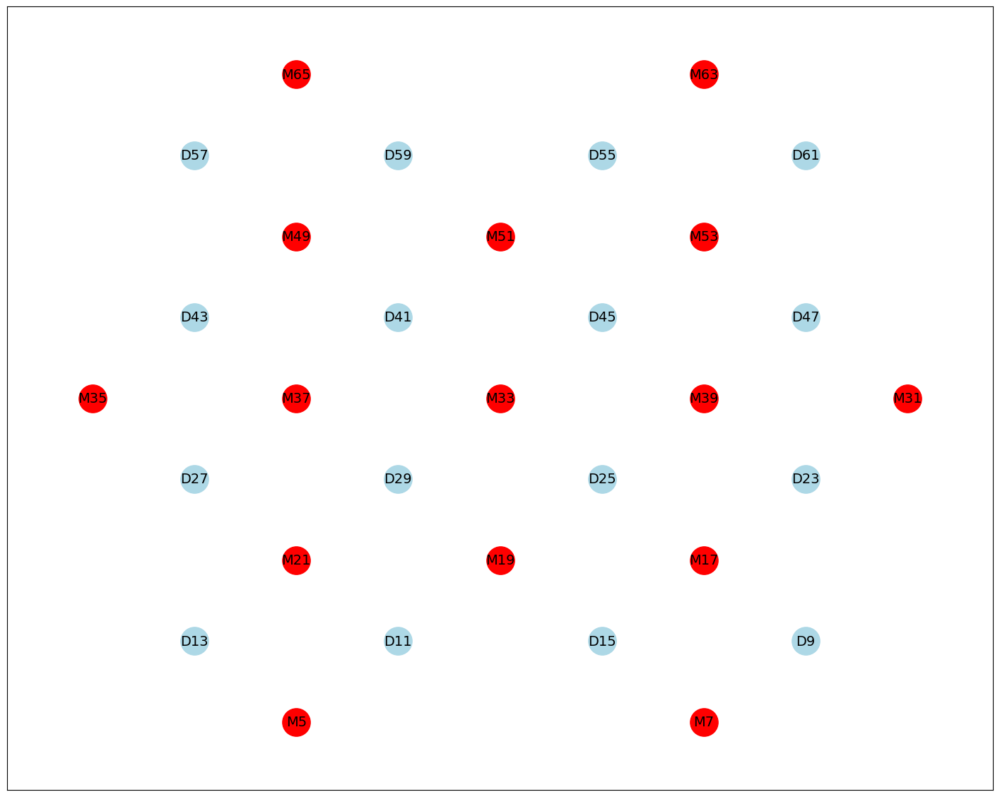

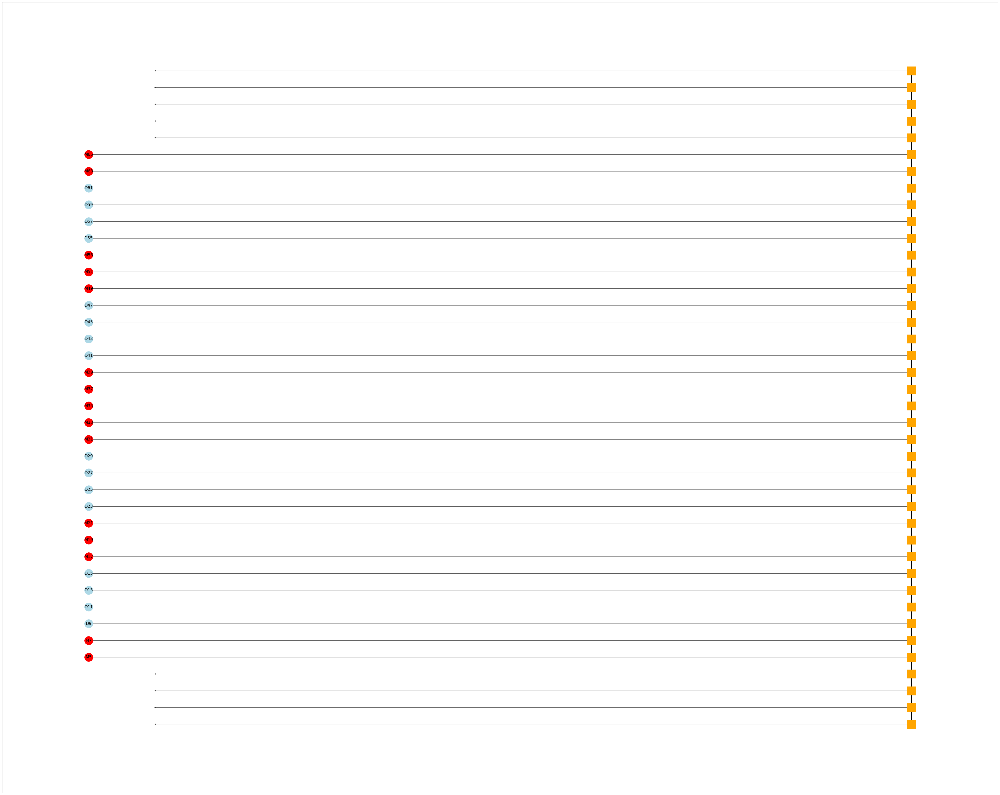

In [4]:
from src.simulator.qccd_circuit import *
from src.compiler.qccd_ion_routing import *

trapCapacity=2
noise=0.01
circuit = QCCDCircuit.generated(
    "surface_code:rotated_memory_z",
    rounds=1,
    distance=4,
    after_clifford_depolarization=noise,
    after_reset_flip_probability=noise,
    before_measure_flip_probability=noise,
    before_round_data_depolarization=noise,
)
arch, (instructions,_) = circuit.processCircuitNetworkedGrid(traps=40, trapCapacity=trapCapacity)

oldPositions = {}
for idx, (ion, pos) in circuit._ionMapping.items():
    oldPositions[idx] = ion.pos
    ion.set(ion.idx, pos[0], pos[1], parent=ion.parent)

fig,ax =plt.subplots()
arch1 = arch
arch1.refreshGraph()
edgesDups = []
edgesPos = []
ionsInvolved = set()
score = 0
for op in instructions:
    if not isinstance(op, TwoQubitMSGate):
        continue
    if not ionsInvolved.isdisjoint(op.ions):
        score+=1
        ionsInvolved=set()
    edgesDups.append((op.ions, score))
    edgesPos.append((op.ionsActedIdxs, score))
    ionsInvolved=ionsInvolved.union(op.ions)
scores = [score for ((ion1,ion2), score) in edgesDups]
color_from_score = {s: (5+i*i)*0 for i, s in enumerate( sorted(list(set(scores)), reverse=True))}
arch1._manipulationTraps.append(([(ion1.idx, ion2.idx) for ((ion1,ion2), score) in edgesDups], [color_from_score[score] for ((ion1,ion2), score) in edgesDups]))
arch1.display(fig, ax, showLabels=False, showEdges=False, show_junction=False)
fig.set_size_inches(arch.WINDOW_SIZE[0]*0.6, arch.WINDOW_SIZE[1]*0.6)
arch1._manipulationTraps = arch1._manipulationTraps[:-1]
for idx, (ion, pos) in circuit._ionMapping.items():
    ion.set(ion.idx, oldPositions[idx][0], oldPositions[idx][1], parent=ion.parent)


arch.refreshGraph()

fig,ax =plt.subplots()
arch.display(fig, ax, showLabels=False)
fig.set_size_inches(arch.WINDOW_SIZE[0]*2, arch.WINDOW_SIZE[1]*2)

allOps, barriers = ionRouting(arch, instructions, trapCapacity=trapCapacity)
parallelOpsMap = paralleliseOperationsWithBarriers(allOps, barriers)
parallelOps = list(dict(parallelOpsMap).values())


print(f"total number of qubit operations: {len(instructions)}")
print(f"total number of operations: {len(allOps)}")
print(f"time for operations: {max(parallelOpsMap.keys())}")

[<src.utils.qccd_operations_on_qubits.QubitReset object at 0x167c2ae10>, <src.utils.qccd_operations_on_qubits.QubitReset object at 0x167c285d0>, <src.utils.qccd_operations_on_qubits.QubitReset object at 0x167c2b3d0>, <src.utils.qccd_operations_on_qubits.QubitReset object at 0x167c28f90>, <src.utils.qccd_operations_on_qubits.QubitReset object at 0x167c28190>, <src.utils.qccd_operations_on_qubits.QubitReset object at 0x167c29790>, <src.utils.qccd_operations_on_qubits.QubitReset object at 0x167c28f50>, <src.utils.qccd_operations_on_qubits.QubitReset object at 0x167c29090>, <src.utils.qccd_operations_on_qubits.QubitReset object at 0x167c297d0>, <src.utils.qccd_operations_on_qubits.QubitReset object at 0x167c29ed0>, <src.utils.qccd_operations_on_qubits.QubitReset object at 0x167c29450>, <src.utils.qccd_operations_on_qubits.QubitReset object at 0x167c28150>, <src.utils.qccd_operations_on_qubits.QubitReset object at 0x167c29810>, <src.utils.qccd_operations_on_qubits.QubitReset object at 0x167

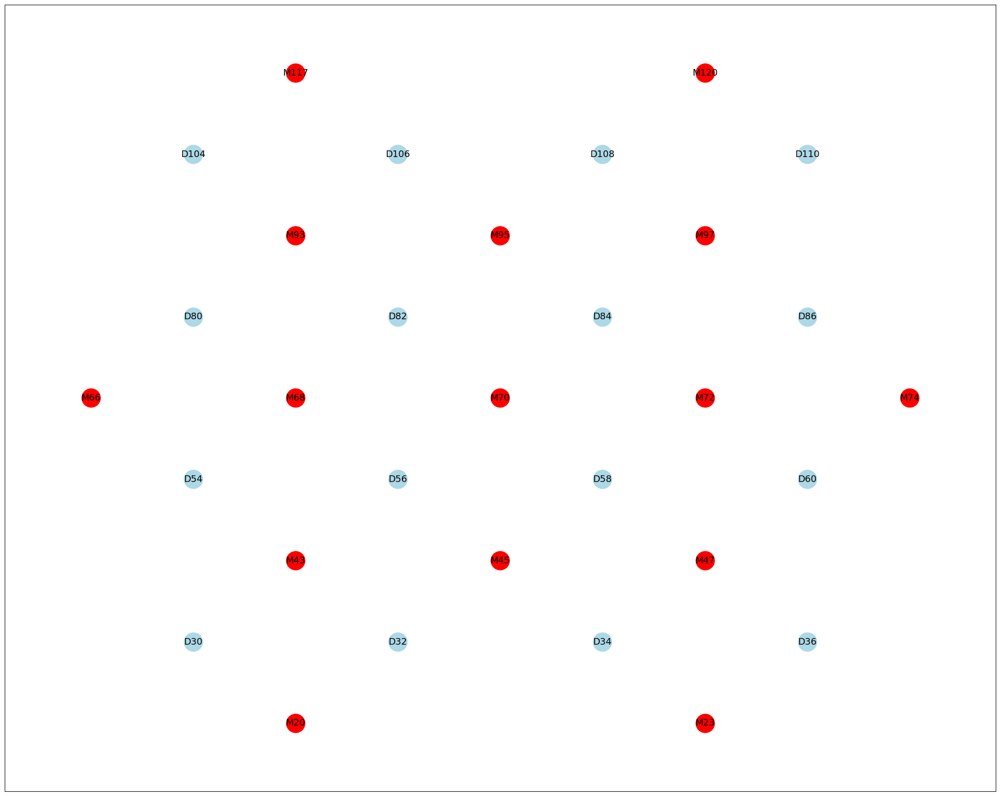

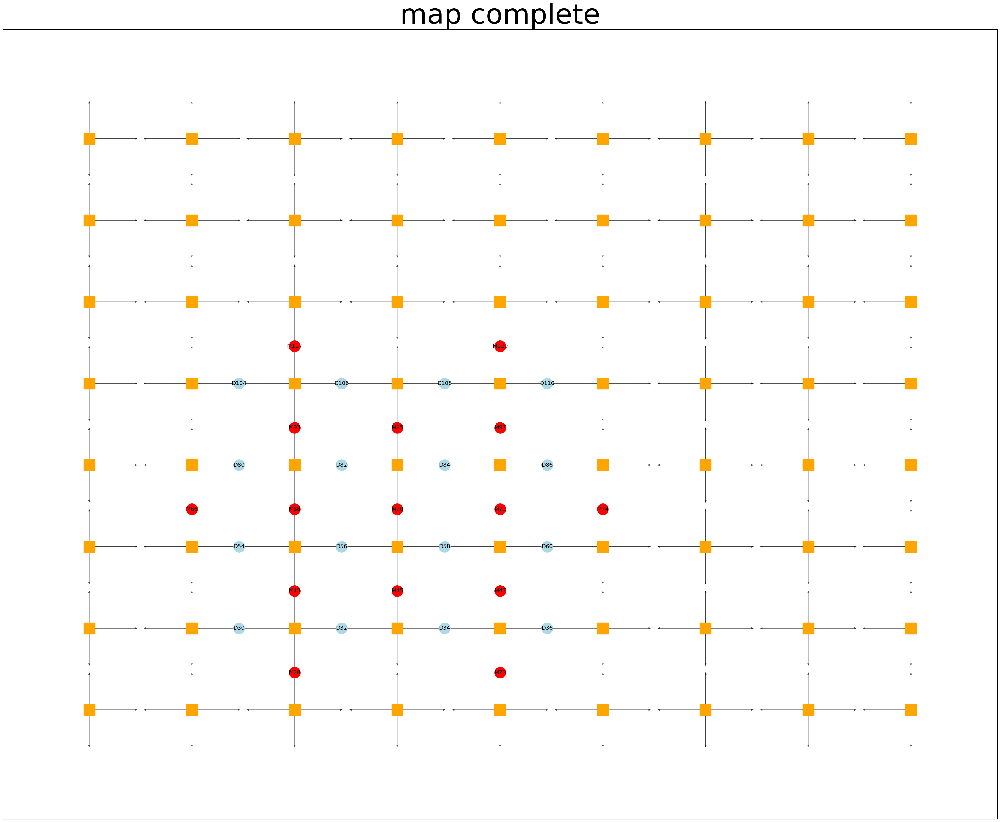

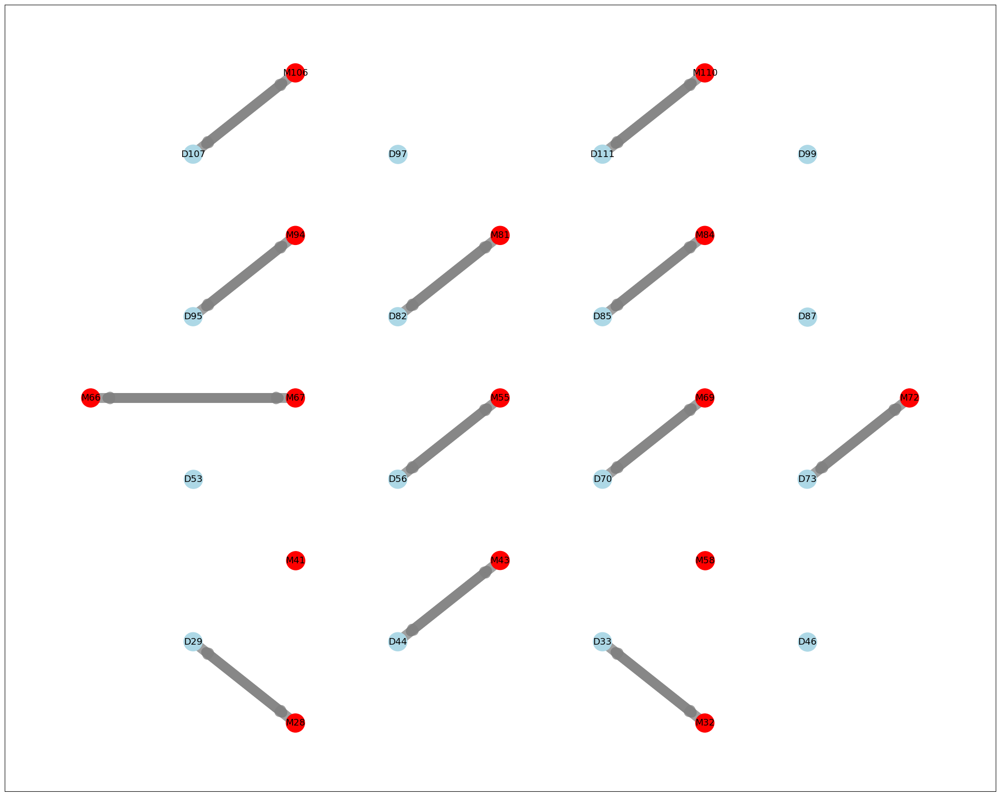

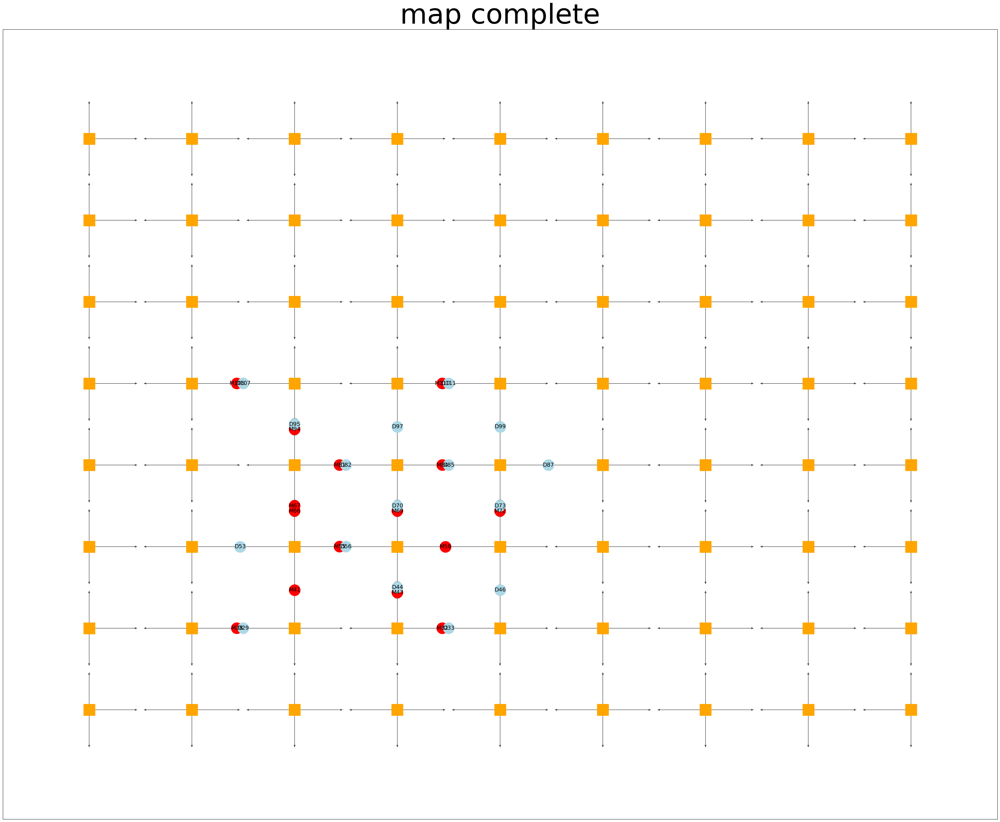

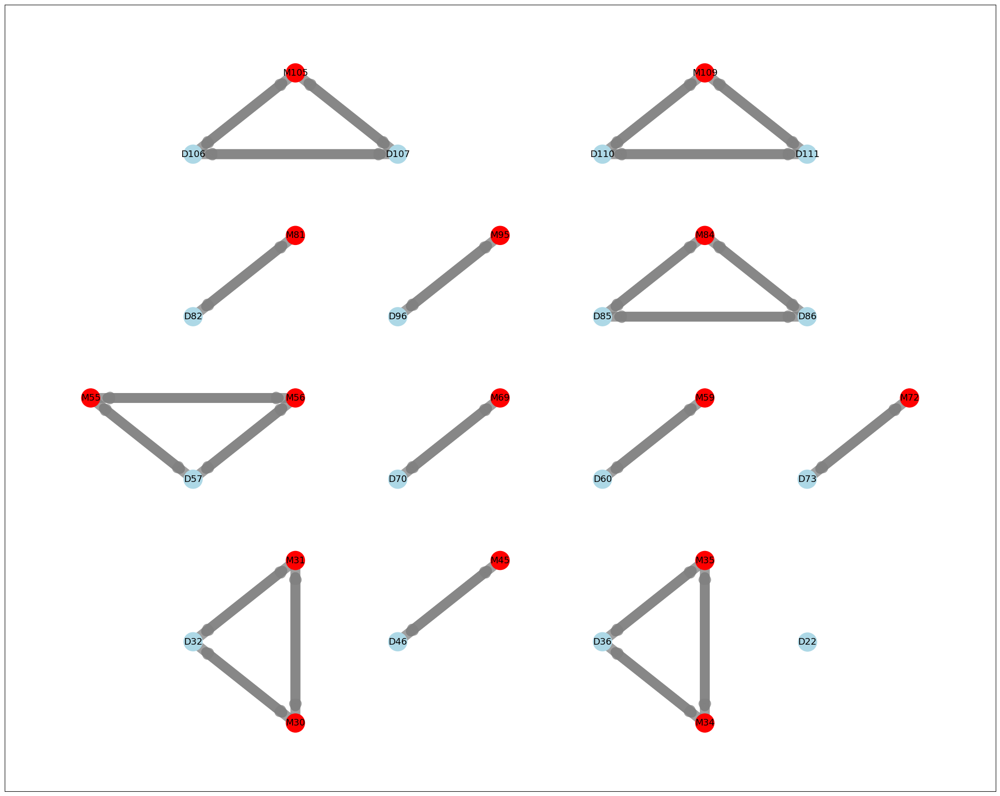

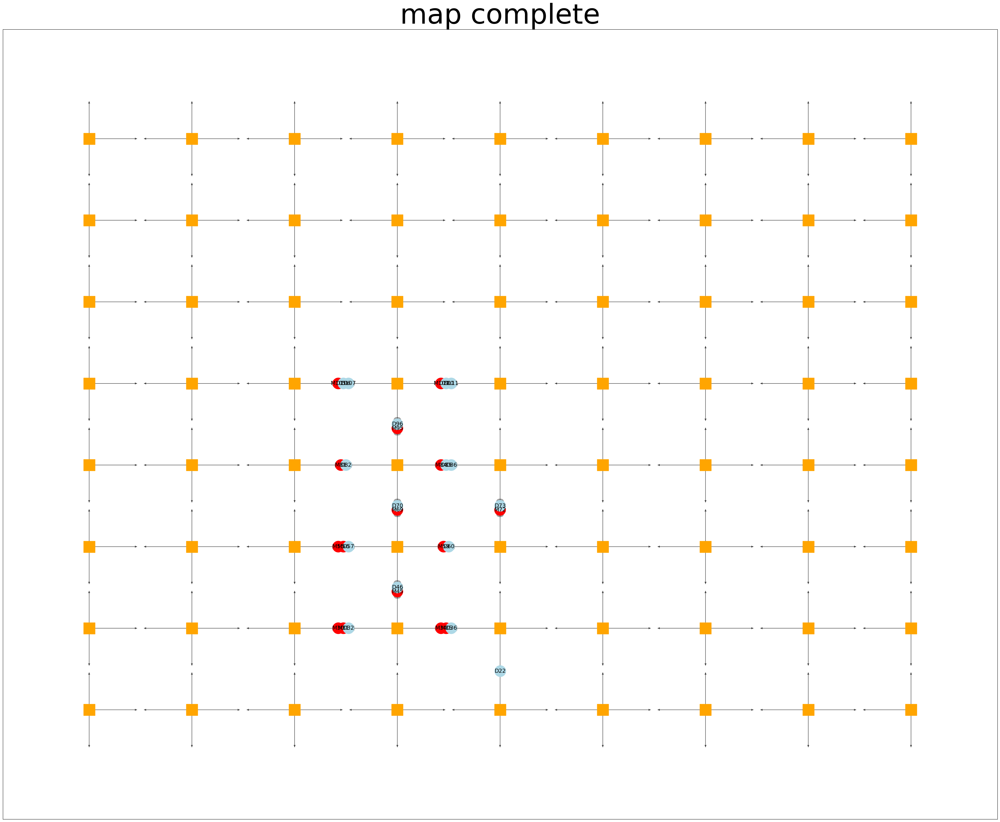

In [5]:
from src.compiler.qccd_ion_routing import *
from src.simulator.qccd_circuit import *
d = 4
# safe to have either barriers or go back
barrierThreshold = np.inf
goBackThreshold = 0
for trapCapacity in [2,3,4]:
    noise=0.01
    circuit = QCCDCircuit.generated(
        "surface_code:rotated_memory_z",
        rounds=1,
        distance=d,
        after_clifford_depolarization=noise,
        after_reset_flip_probability=noise,
        before_measure_flip_probability=noise,
        before_round_data_depolarization=noise,
    )
    nqubitsNeeded = 2 * d**2 - 1

    nrowsNeeded = int(np.sqrt(nqubitsNeeded))+2
    arch, (instructions, opBarriers) = circuit.processCircuitAugmentedGrid(rows=nrowsNeeded, cols=nrowsNeeded, trapCapacity=trapCapacity)
    print(instructions)
    oldPositions = {}
    for idx, (ion, pos) in circuit._ionMapping.items():
        oldPositions[idx] = ion.pos
        ion.set(ion.idx, pos[0], pos[1], parent=ion.parent)

    fig,ax =plt.subplots()
    arch1 = arch
    arch1.refreshGraph()
    edgesDups = []
    edgesPos = []
    ionsInvolved = set()
    score = 0
    for op in instructions:
        if not isinstance(op, TwoQubitMSGate):
            continue
        if not ionsInvolved.isdisjoint(op.ions):
            score+=1
            ionsInvolved=set()
        edgesDups.append((op.ions, score))
        edgesPos.append((op.ionsActedIdxs, score))
        ionsInvolved=ionsInvolved.union(op.ions)
    scores = [score for ((ion1,ion2), score) in edgesDups]
    color_from_score = {s: (5+i*i)*0 for i, s in enumerate( sorted(list(set(scores)), reverse=True))}
    arch1._manipulationTraps.append(([(ion1.idx, ion2.idx) for ((ion1,ion2), score) in edgesDups], [color_from_score[score] for ((ion1,ion2), score) in edgesDups]))
    arch1.display(fig, ax, showLabels=False, showEdges=False, show_junction=False)
    fig.set_size_inches(arch.WINDOW_SIZE[0]*0.9, arch.WINDOW_SIZE[1]*0.9)
    arch1._manipulationTraps = arch1._manipulationTraps[:-1]
    for idx, (ion, pos) in circuit._ionMapping.items():
        ion.set(ion.idx, oldPositions[idx][0], oldPositions[idx][1], parent=ion.parent)

    arch.refreshGraph()

    fig,ax =plt.subplots()
    arch.display(fig, ax, title='map complete', showLabels=False)
    fig.set_size_inches(arch.WINDOW_SIZE[0]*1.5, arch.WINDOW_SIZE[1]*1.5)

    opBarriers = opBarriers if trapCapacity<=barrierThreshold else []
    allOps, barriers = ionRouting(arch, instructions, trapCapacity)
    parallelOpsMap = paralleliseOperationsWithBarriers(allOps, barriers)
    parallelOps = list(dict(parallelOpsMap).values())

    errs = circuit.simulate(allOps)

    arch = circuit.resetArch()
    arch.refreshGraph()

    trapSet = set()
    junctionSet = set()
    for op in allOps:
        for c in op.involvedComponents:
            if isinstance(c, Trap):
                trapSet.add(c)
            elif isinstance(c, Junction):
                junctionSet.add(c)


    Njz = len(junctionSet) # each junction is one zone
    Nlz = len(trapSet)*trapCapacity # each trap is k zones
    Nde_lz = 10
    Nde_jz = 20
    Nse_z = 10
   

    Njz = int(np.ceil(nqubitsNeeded / (2*(trapCapacity-1))) )# 2 traps per junction
    Nlz = nqubitsNeeded-Njz
    Nde = Nde_lz*Nlz+Nde_jz*Njz
    Nse = Nse_z*(Njz+Nlz)

    Num_electrodes = Nde+Nse
    Num_DACs = Num_electrodes


    print(f"total number of qubit operations: {len(instructions)}")
    print(f"total number of operations: {len(allOps)}")
    print(f"time for operations: {max(parallelOpsMap.keys())}")
    print(f'Number of Linear Zones: {Nlz}')
    print(f"Number of Junction Zones: {Njz}")
    print(f"Number of Electrodes: {Num_electrodes}={Nse}+{Nde}")
    print(f"Errors: {errs}")


In [ ]:
print(len(paralleliseOperationsSimple(allOps)))

In [ ]:
parallelOps = paralleliseOperationsSimple(allOps)
arch = circuit.resetArch()
arch.refreshGraph()


axsPerFig = 2
figs = []
axs = []
numFigs = int(len(parallelOps)/(axsPerFig))+int((len(parallelOps)%(axsPerFig))>0)
for _ in range(numFigs):
    fig, axs_ = plt.subplots(1, axsPerFig, sharex=False, sharey=False)
    figs.extend([fig]*axsPerFig)
    axs.extend(axs_)

figs = figs[:len(parallelOps)]
axs = axs[:len(parallelOps)]

for fig, ax, parallelOp in zip(figs, axs, parallelOps):
    arch.display(fig, ax, operation=parallelOp, runOps=True, showLabels=False)
  

KeyboardInterrupt: 

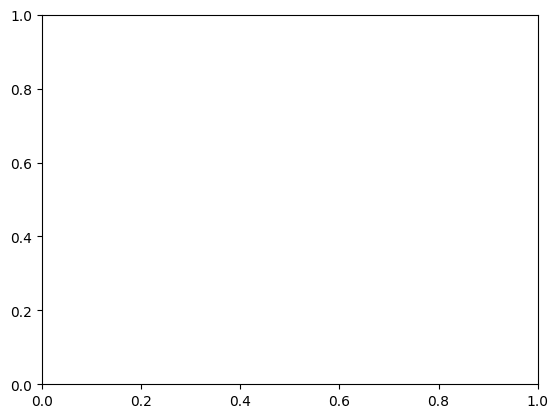

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
%matplotlib inline
from IPython.display import HTML, clear_output, display

arch = circuit.resetArch()
arch.refreshGraph()
fig,ax=plt.subplots()

parallelOpsSimple = paralleliseOperationsSimple(allOps)
def update(frame, _arch):
    ax.clear()
    # Clear the output for dynamic display in Jupyter notebook
    clear_output(wait=True)
    if frame>0:
        op: ParallelOperation = parallelOpsSimple[frame-1]
        title = f"Operation: {op.label}"
        _arch.display(fig, ax, title, operation=op, runOps=True, showLabels=False)
    else:
        _arch.display(fig, ax, showLabels=False)
    return display(fig)
import time
time.sleep(10)
ani = FuncAnimation(fig, lambda frame: update(frame, arch), frames=len(parallelOpsSimple)+1, repeat=False)
HTML(ani.to_jshtml())

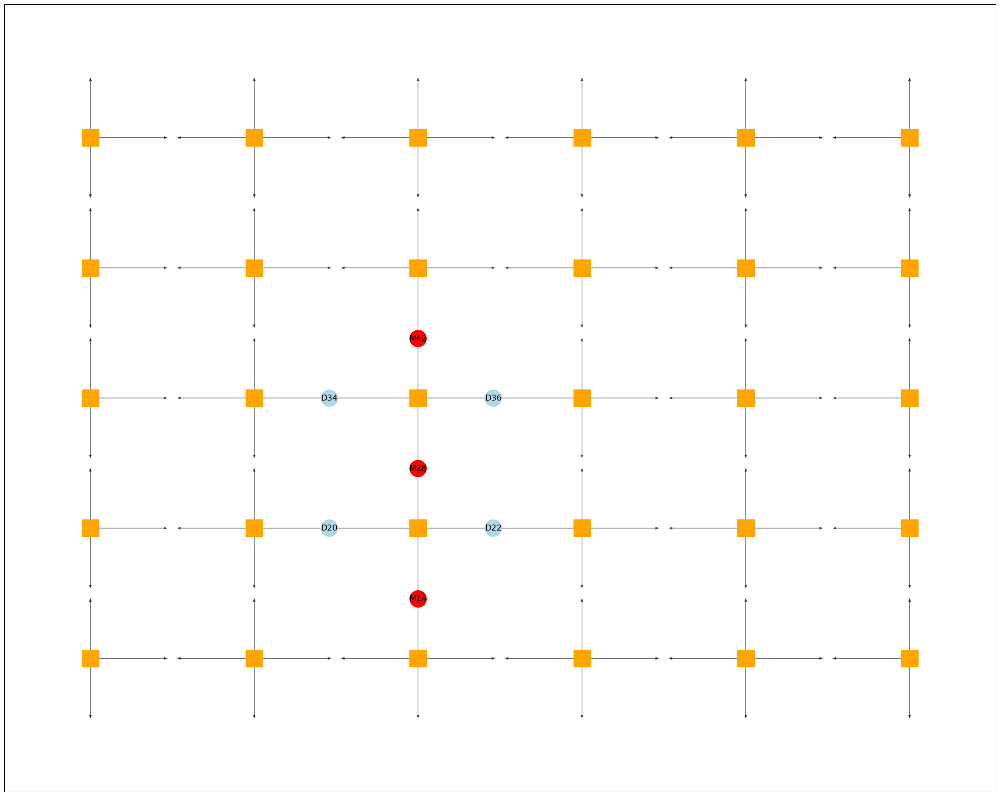

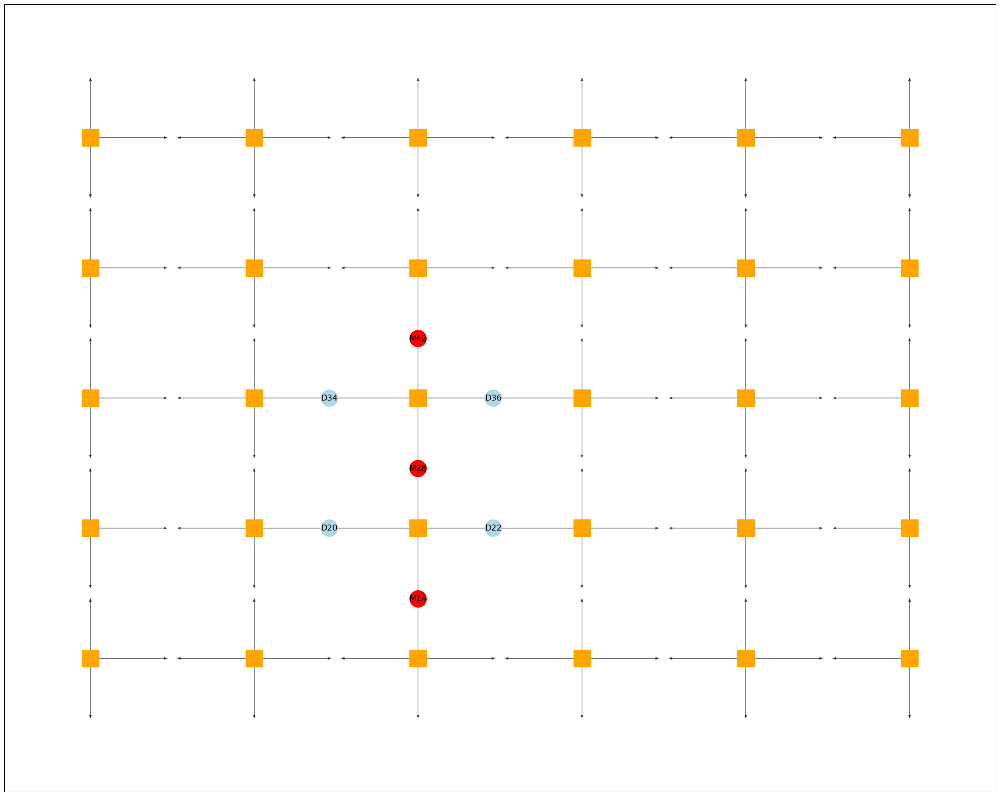

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
%matplotlib inline
from IPython.display import HTML, clear_output, display
import time
arch = circuit.resetArch()
arch.refreshGraph()
fig,ax=plt.subplots()
parallelOpsTimes = sorted(parallelOpsMap.keys())


def update(frame, _arch):
    ax.clear()
    # Clear the output for dynamic display in Jupyter notebook
    clear_output(wait=True)
    if frame>0:
        op: ParallelOperation = parallelOps[frame-1]
        title = f"Operation {round(parallelOpsTimes[frame-1],6)}: {op.label}"
        _arch.display(fig, ax, title, operation=op, runOps=True, showLabels=False)
    else:
        _arch.display(fig, ax, showLabels=False)
    # time.sleep(3)
    return display(fig)
import time
time.sleep(10)
ani = FuncAnimation(fig, lambda frame: update(frame, arch), frames=len(parallelOps)+1, repeat=False)
HTML(ani.to_jshtml())

In [1]:

# gate improvement that is expected in the next few years is about 10X or maximum 100X, not more than that
gate_improvements = [0.025, 0.05, 0.1, 0.25, 0.5, 1.0, 5.0, 10.0, 12.5, 15.0, 20.0, 25.0, 35.0, 50.0, 100.0]
distances = [2,3,4,5,6,7,8,9,10,11,12]
# capacities refer to maximum number of qubits we place in a single trap for the initial QCCD configuration
# true maximum trap capacity, i.e. the maximum number of ions each trap can hold in any instance, is 5 times this initial configuration maximum value 
capacities = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,30,60,120]

# FIXME legacy formatting no longer need the forwarding/routing requirements
data = {k: {"Forwarding": {d: {c: None for c in capacities} for d in distances}, "Routing": {d: {c: None for c in capacities} for d in distances}} for k in ("PhysicalZErrorRates", "PhysicalXErrorRates","Operations", "ElapsedTime", "MeanConcurrency", "QubitOperations", "LogicalErrorRates", "DACs", "Electrodes")}


In [2]:
for k1 in data.keys():
    for k2 in data[k1].keys():
        for k3 in data[k1][k2].keys():
            print(k1, k2, k3, data[k1][k2][k3])

PhysicalZErrorRates Forwarding 2 {2: None, 3: None, 4: None, 5: None, 6: None, 7: None, 8: None, 9: None, 10: None, 11: None, 12: None, 13: None, 14: None, 15: None, 30: None, 60: None, 120: None}
PhysicalZErrorRates Forwarding 3 {2: None, 3: None, 4: None, 5: None, 6: None, 7: None, 8: None, 9: None, 10: None, 11: None, 12: None, 13: None, 14: None, 15: None, 30: None, 60: None, 120: None}
PhysicalZErrorRates Forwarding 4 {2: None, 3: None, 4: None, 5: None, 6: None, 7: None, 8: None, 9: None, 10: None, 11: None, 12: None, 13: None, 14: None, 15: None, 30: None, 60: None, 120: None}
PhysicalZErrorRates Forwarding 5 {2: None, 3: None, 4: None, 5: None, 6: None, 7: None, 8: None, 9: None, 10: None, 11: None, 12: None, 13: None, 14: None, 15: None, 30: None, 60: None, 120: None}
PhysicalZErrorRates Forwarding 6 {2: None, 3: None, 4: None, 5: None, 6: None, 7: None, 8: None, 9: None, 10: None, 11: None, 12: None, 13: None, 14: None, 15: None, 30: None, 60: None, 120: None}
PhysicalZErrorR

In [ ]:
data = ...

In [8]:
with open('saved_Data_grid_with_electrodes_cooling.txt', 'w') as f:
    f.write(str(data))

In [3]:
from src.simulator.qccd_circuit import *

ds = [2,4,6]
cs = [2]
for d in ds:
    for c in cs:
        print(process_circuit(d,c,[1.0],100_000))
        print(process_circuit_wise_arch(d,c,[1.0], 100_000))
        print('\n')
     

{'ElapsedTime': {'Forwarding': 0.009475}, 'Operations': {'Forwarding': 161}, 'MeanConcurrency': {'Forwarding': 2.4344262295081966}, 'QubitOperations': {'Forwarding': 65}, 'LogicalErrorRates': {'Forwarding': [0.03229]}, 'PhysicalZErrorRates': {'Forwarding': [0.003458540052928386]}, 'PhysicalXErrorRates': {'Forwarding': [0.0037241379310344862]}, 'Electrodes': {'Forwarding': 340}, 'DACs': {'Forwarding': 340}, 'Capacity': 2, 'Distance': 2}
{'ElapsedTime': {'Forwarding': 0.01768}, 'Operations': {'Forwarding': 69}, 'MeanConcurrency': {'Forwarding': 2.0238095238095237}, 'QubitOperations': {'Forwarding': 65}, 'LogicalErrorRates': {'Forwarding': [0.03371]}, 'PhysicalZErrorRates': {'Forwarding': [0.003524153855025594]}, 'PhysicalXErrorRates': {'Forwarding': [0.0037241379310344862]}, 'Electrodes': {'Forwarding': 180}, 'DACs': {'Forwarding': 101}, 'Capacity': 2, 'Distance': 2}


{'ElapsedTime': {'Forwarding': 0.01073}, 'Operations': {'Forwarding': 925}, 'MeanConcurrency': {'Forwarding': 11.8674698

In [4]:
from src.simulator.qccd_circuit import *

num_shots = 1_000_000
data: Dict[str, Dict[str, Dict[int, Dict[int, Any]]]]


import concurrent.futures
import logging

import os

num_cores = os.cpu_count()
num_processes = num_cores 

logger = logging.getLogger()
logger.setLevel(logging.INFO)
handler = logging.FileHandler("process_log.txt")
formatter = logging.Formatter('%(processName)s - %(levelname)s - %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)

with concurrent.futures.ProcessPoolExecutor(max_workers=num_processes) as executor:
    futures = []
    for d in distances:
        for c in capacities:
            logger.info(f"Submitting task for distance {d} and capacity {c}.")
            futures.append(executor.submit(process_circuit, d, c, gate_improvements, num_shots))

    for future in concurrent.futures.as_completed(futures):
        if future.exception() is not None:
            logger.error(f"Exception Occured for future", exc_info=future.exception())
            continue

        try:
            result = future.result()

            d = result["Distance"]
            c = result["Capacity"]

            for label in result["ElapsedTime"]:
                data["ElapsedTime"][label][d][c] = result["ElapsedTime"][label]
                data["Operations"][label][d][c] = result["Operations"][label]
                data["MeanConcurrency"][label][d][c] = result["MeanConcurrency"][label]
                data["QubitOperations"][label][d][c] = result["QubitOperations"][label]
                data["LogicalErrorRates"][label][d][c] = result["LogicalErrorRates"][label]
                data["PhysicalXErrorRates"][label][d][c] = result["PhysicalXErrorRates"][label]
                data["PhysicalZErrorRates"][label][d][c] = result["PhysicalZErrorRates"][label]
                data["DACs"][label][d][c] = result["DACs"][label]
                data["Electrodes"][label][d][c] = result["Electrodes"][label]

            
            logger.info(f"Processing result for distance {result['Distance']}, capacity {result['Capacity']}.")
        except Exception as e:
            logger.error(f"Exception Occured for future", exc_info=True)
            continue

        

In [5]:
wise_data = {k: {"Forwarding": {d: {c: None for c in capacities} for d in distances}, "Routing": {d: {c: None for c in capacities} for d in distances}} for k in ("PhysicalZErrorRates", "PhysicalXErrorRates","Operations", "ElapsedTime", "MeanConcurrency", "QubitOperations", "LogicalErrorRates", "DACs", "Electrodes")}


In [7]:
with open('saved_wise_Data_grid_with_electrodes_cooling.txt', 'w') as f:
    f.write(str(wise_data))

In [6]:
from src.simulator.qccd_circuit import *

num_shots = 1_000_000
data: Dict[str, Dict[str, Dict[int, Dict[int, Any]]]]


import concurrent.futures
import logging

import os

num_cores = os.cpu_count()
num_processes = num_cores 

logger = logging.getLogger()
logger.setLevel(logging.INFO)
handler = logging.FileHandler("process_log_wise.txt")
formatter = logging.Formatter('%(processName)s - %(levelname)s - %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)

with concurrent.futures.ProcessPoolExecutor(max_workers=num_processes) as executor:
    futures = []
    for d in distances:
        for c in capacities:
            logger.info(f"Submitting task for distance {d} and capacity {c}.")
            futures.append(executor.submit(process_circuit_wise_arch, d, c, gate_improvements, num_shots))

    for future in concurrent.futures.as_completed(futures):
        if future.exception() is not None:
            logger.error(f"Exception Occured for future", exc_info=future.exception())
            continue

        try:
            result = future.result()

            d = result["Distance"]
            c = result["Capacity"]

            for label in result["ElapsedTime"]:
                wise_data["ElapsedTime"][label][d][c] = result["ElapsedTime"][label]
                wise_data["Operations"][label][d][c] = result["Operations"][label]
                wise_data["MeanConcurrency"][label][d][c] = result["MeanConcurrency"][label]
                wise_data["QubitOperations"][label][d][c] = result["QubitOperations"][label]
                wise_data["LogicalErrorRates"][label][d][c] = result["LogicalErrorRates"][label]
                wise_data["PhysicalXErrorRates"][label][d][c] = result["PhysicalXErrorRates"][label]
                wise_data["PhysicalZErrorRates"][label][d][c] = result["PhysicalZErrorRates"][label]
                wise_data["DACs"][label][d][c] = result["DACs"][label]
                wise_data["Electrodes"][label][d][c] = result["Electrodes"][label]

            
            logger.info(f"Processing result for distance {result['Distance']}, capacity {result['Capacity']}.")
        except Exception as e:
            logger.error(f"Exception Occured for future", exc_info=True)
            continue

        

In [11]:
from typing import Dict, Any

for k1 in data.keys():
    for k2 in data[k1].keys():
        for k3 in data[k1][k2].keys():
            data[k1][k2][k3] = [data[k1][k2][k3][c] for c in capacities]


data: Dict[str, Dict[str, Dict[int, Dict[int, Any]]]]


IndexError: list index out of range

In [331]:


for k1 in data.keys():
    for k2 in data[k1].keys():
        for k3 in data[k1][k2].keys():
            data[k1][k2][k3] = [data[k1][k2][k3][c] for c in capacities]


data: Dict[str, Dict[str, Dict[int, Dict[int, Any]]]]


In [10]:
# gate improvement that is expected in the next few years is about 10X or maximum 100X, not more than that
gate_improvements = [0.025, 0.05, 0.1, 0.25, 0.5, 1.0, 5.0, 10.0, 12.5, 15.0, 20.0, 25.0, 35.0, 50.0, 100.0]
distances = [2,3,4,5,6,7,8,9,10,11,12]
# capacities refer to maximum number of qubits we place in a single trap for the initial QCCD configuration
# true maximum trap capacity, i.e. the maximum number of ions each trap can hold in any instance, is 5 times this initial configuration maximum value 
capacities = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,30,60,120]


In [ ]:
data = ...

In [72]:
grid_data = ...

In [73]:
switch_data = ...

In [3]:
import matplotlib as mpl
import matplotlib.colors as mplcolors


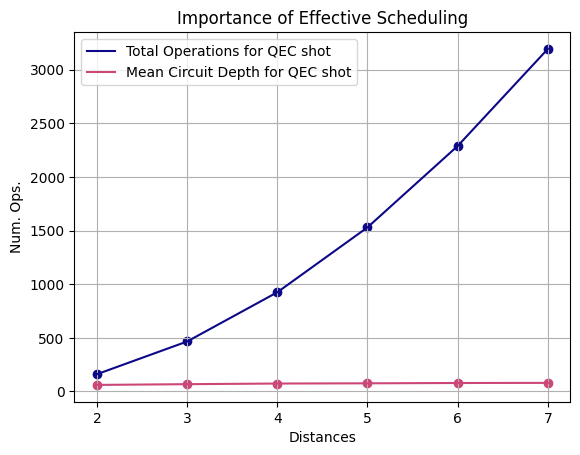

In [12]:

cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 3))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, ax1 = plt.subplots()

iLabel, label = 0, "Forwarding"
ax1.plot(distances, [data["Operations"][label][d][0] for d in distances], c=colors[0], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Total Operations for QEC shot")
ax1.plot(distances, [int(data["Operations"][label][d][0]/data["MeanConcurrency"][label][d][0]) for d in distances], c=colors[1], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Mean Circuit Depth for QEC shot")
ax1.scatter(distances, [data["Operations"][label][d][0] for d in distances], c=colors[0], marker=("v" if iLabel==1 else "o"))
ax1.scatter(distances, [int(data["Operations"][label][d][0]/data["MeanConcurrency"][label][d][0]) for d in distances], c=colors[1], marker=("v" if iLabel==1 else "o"))
ax1.legend()
ax1.set_title('Importance of Effective Scheduling')
ax1.set_xticks(distances)
ax1.set_xlabel('Distances')
ax1.set_ylabel('Num. Ops.')
ax1.grid(which='major')


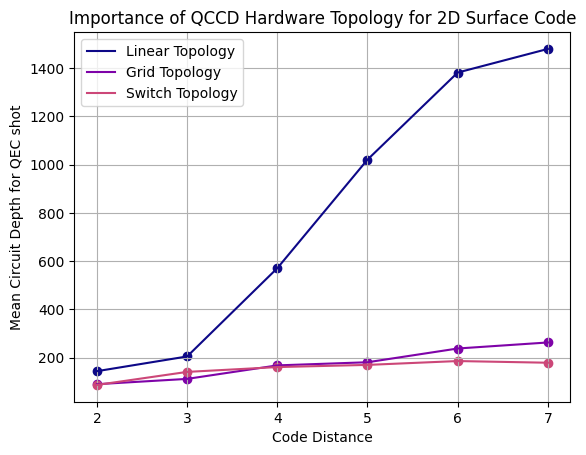

In [85]:
import matplotlib as mpl
import matplotlib.colors as mplcolors
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 5))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, ax1 = plt.subplots()

iLabel, label = 0, "Forwarding"
ax1.plot(distances, [int(linear_data["Operations"][label][d][3]/linear_data["MeanConcurrency"][label][d][3]) for d in distances], c=colors[0], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Linear Topology")
ax1.scatter(distances, [int(linear_data["Operations"][label][d][3]/linear_data["MeanConcurrency"][label][d][3]) for d in distances], c=colors[0], marker=("v" if iLabel==1 else "o"))
ax1.plot(distances, [int(grid_data["Operations"][label][d][3]/grid_data["MeanConcurrency"][label][d][3]) for d in distances], c=colors[1], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Grid Topology")
ax1.scatter(distances, [int(grid_data["Operations"][label][d][3]/grid_data["MeanConcurrency"][label][d][3]) for d in distances], c=colors[1], marker=("v" if iLabel==1 else "o"))
ax1.plot(distances, [int(switch_data["Operations"][label][d][3]/switch_data["MeanConcurrency"][label][d][3]) for d in distances], c=colors[2], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Switch Topology")
ax1.scatter(distances, [int(switch_data["Operations"][label][d][3]/switch_data["MeanConcurrency"][label][d][3]) for d in distances], c=colors[2], marker=("v" if iLabel==1 else "o"))
ax1.legend()
ax1.set_title('Topology Effect for Trap Capacity 3 on 2D code')
ax1.set_xticks(distances)
ax1.set_xlabel('Code Distance')
ax1.set_ylabel('Mean Circuit Depth for QEC shot')
ax1.grid(which='major')


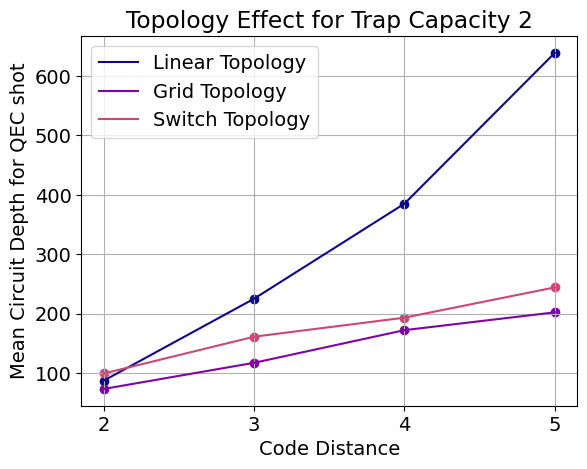

In [191]:
import matplotlib as mpl
import matplotlib.colors as mplcolors
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 5))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, ax1 = plt.subplots()
_distances = [2,3,4,5]
iLabel, label = 0, "Forwarding"
ax1.plot(_distances, [int(linear_data["Operations"][label][d][2]/linear_data["MeanConcurrency"][label][d][2]) for d in _distances], c=colors[0], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Linear Topology")
ax1.scatter(_distances, [int(linear_data["Operations"][label][d][2]/linear_data["MeanConcurrency"][label][d][2]) for d in _distances], c=colors[0], marker=("v" if iLabel==1 else "o"))
ax1.plot(_distances, [int(grid_data["Operations"][label][d][2]/grid_data["MeanConcurrency"][label][d][2]) for d in _distances], c=colors[1], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Grid Topology")
ax1.scatter(_distances, [int(grid_data["Operations"][label][d][2]/grid_data["MeanConcurrency"][label][d][2]) for d in _distances], c=colors[1], marker=("v" if iLabel==1 else "o"))
ax1.plot(_distances, [int(switch_data["Operations"][label][d][2]/switch_data["MeanConcurrency"][label][d][2]) for d in _distances], c=colors[2], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Switch Topology")
ax1.scatter(_distances, [int(switch_data["Operations"][label][d][2]/switch_data["MeanConcurrency"][label][d][2]) for d in _distances], c=colors[2], marker=("v" if iLabel==1 else "o"))
ax1.legend()
ax1.set_title('Topology Effect for Trap Capacity 2')
ax1.set_xticks(_distances)
ax1.set_xlabel('Code Distance')
ax1.set_ylabel('Mean Circuit Depth for QEC shot')
ax1.grid(which='major')


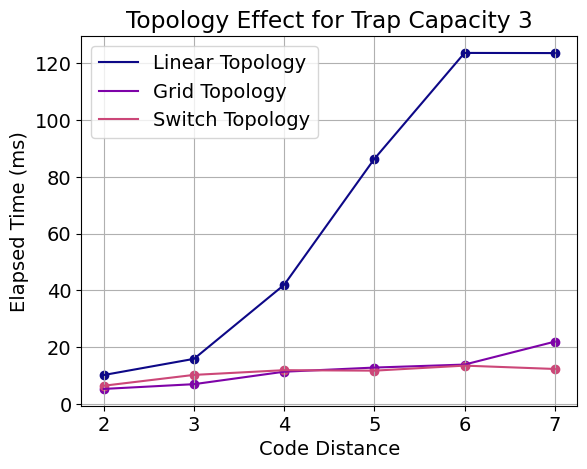

In [230]:
import matplotlib as mpl
import matplotlib.colors as mplcolors
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 5))
colors = [mplcolors.to_hex(c) for c in colors]
_c = 3
fig1, ax1 = plt.subplots()
_distances = [2,3,4,5,6,7]
iLabel, label = 0, "Forwarding"
ax1.plot(_distances, [1e3*float(linear_data["ElapsedTime"][label][d][capacities.index(_c)]) for d in _distances], c=colors[0], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Linear Topology")
ax1.scatter(_distances, [1e3*float(linear_data["ElapsedTime"][label][d][capacities.index(_c)]) for d in _distances], c=colors[0], marker=("v" if iLabel==1 else "o"))
ax1.plot(_distances, [1e3*float(grid_data["ElapsedTime"][label][d][capacities.index(_c)]) for d in _distances], c=colors[1], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Grid Topology")
ax1.scatter(_distances, [1e3*float(grid_data["ElapsedTime"][label][d][capacities.index(_c)]) for d in _distances], c=colors[1], marker=("v" if iLabel==1 else "o"))
ax1.plot(_distances, [1e3*float(switch_data["ElapsedTime"][label][d][capacities.index(_c)]) for d in _distances], c=colors[2], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Switch Topology")
ax1.scatter(_distances, [1e3*float(switch_data["ElapsedTime"][label][d][capacities.index(_c)]) for d in _distances], c=colors[2], marker=("v" if iLabel==1 else "o"))
ax1.legend()
ax1.set_title(f'Topology Effect for Trap Capacity {_c}')
ax1.set_xticks(_distances)
ax1.set_xlabel('Code Distance')
ax1.set_ylabel('Elapsed Time (ms)')
ax1.grid(which='major')


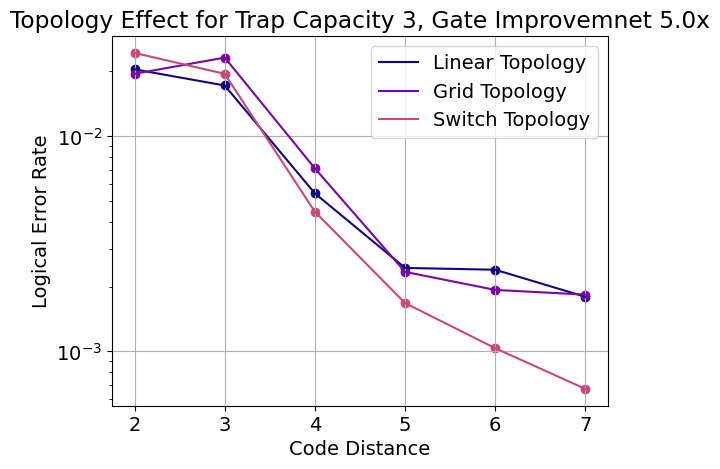

In [227]:
import matplotlib as mpl
import matplotlib.colors as mplcolors
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 5))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, ax1 = plt.subplots()
_c =3
_gi = gate_improvements.index(5)

_distances = [2,3,4,5,6,7]
iLabel, label = 0, "Forwarding"
ax1.plot(_distances, [float(linear_data["LogicalErrorRates"][label][d][capacities.index(_c)][_gi]) for d in _distances], c=colors[0], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Linear Topology")
ax1.scatter(_distances, [float(linear_data["LogicalErrorRates"][label][d][capacities.index(_c)][_gi]) for d in _distances], c=colors[0], marker=("v" if iLabel==1 else "o"))
ax1.plot(_distances, [float(grid_data["LogicalErrorRates"][label][d][capacities.index(_c)][_gi]) for d in _distances], c=colors[1], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Grid Topology")
ax1.scatter(_distances, [float(grid_data["LogicalErrorRates"][label][d][capacities.index(_c)][_gi]) for d in _distances], c=colors[1], marker=("v" if iLabel==1 else "o"))
ax1.plot(_distances, [float(switch_data["LogicalErrorRates"][label][d][capacities.index(_c)][_gi]) for d in _distances], c=colors[2], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Switch Topology")
ax1.scatter(_distances, [float(switch_data["LogicalErrorRates"][label][d][capacities.index(_c)][_gi]) for d in _distances], c=colors[2], marker=("v" if iLabel==1 else "o"))
ax1.legend()
ax1.set_title(f'Topology Effect for Trap Capacity {_c}, Gate Improvemnet {gate_improvements[_gi]}x')
ax1.set_xticks(_distances)
ax1.set_xlabel('Code Distance')
ax1.set_ylabel('Logical Error Rate')
ax1.grid(which='major')
ax1.set_yscale('log')


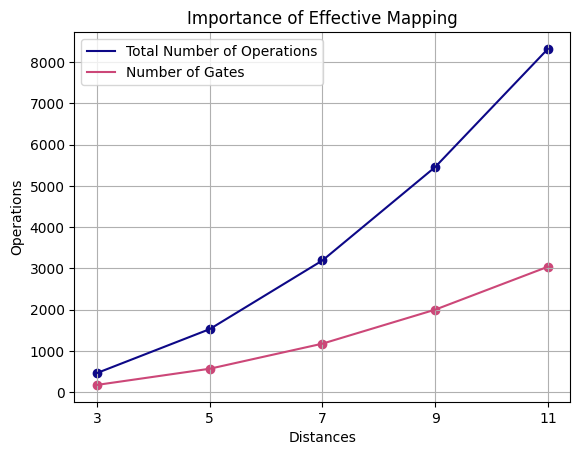

In [9]:
_distances = [3,5,7,9,11]

cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 3))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, ax1 = plt.subplots()

iLabel, label = 0, "Forwarding"
ax1.plot(_distances, [data["Operations"][label][d][0] for d in _distances], c=colors[0], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Total Number of Operations")
ax1.plot(_distances, [data["QubitOperations"][label][d][0] for d in _distances], c=colors[1], linestyle=("dashed" if iLabel==1 else "solid"), label=f"Number of Gates")
ax1.scatter(_distances, [data["Operations"][label][d][0] for d in _distances], c=colors[0], marker=("v" if iLabel==1 else "o"))
ax1.scatter(_distances, [data["QubitOperations"][label][d][0] for d in _distances], c=colors[1], marker=("v" if iLabel==1 else "o"))
ax1.legend()
ax1.set_title('Importance of Effective Mapping')
ax1.set_xlabel('Distances')
ax1.set_xticks(_distances)
ax1.set_ylabel('Operations')
ax1.grid(which='major')





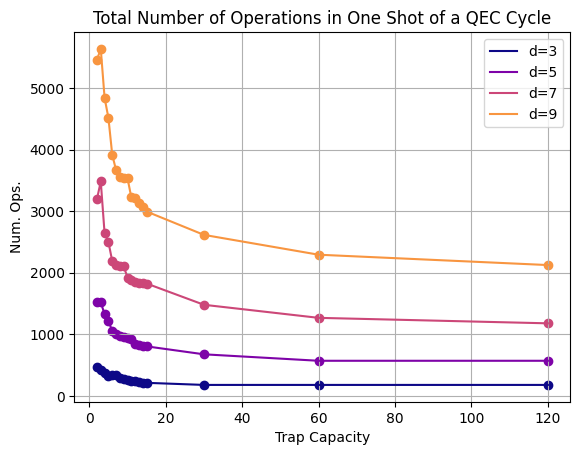

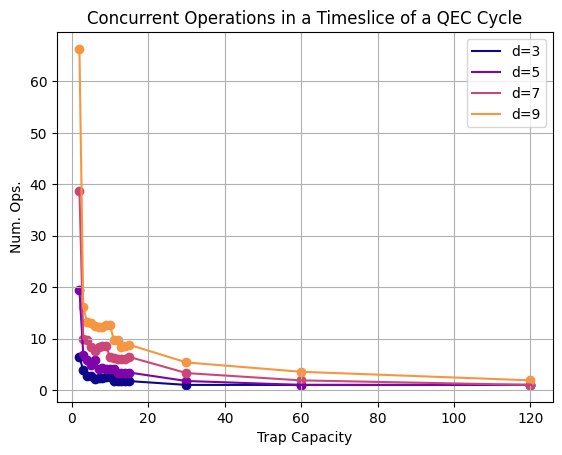

In [12]:
_distances = [3,5,7,9]
_capacities = capacities
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_distances)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, ax1 = plt.subplots()

iLabel, label = 0, "Forwarding"
for j, d in enumerate(_distances):
    ax1.plot(_capacities, [data["Operations"][label][d][i] for i in range(len(_capacities))], c=colors[j], linestyle=("dashed" if iLabel==1 else "solid"), label=f"d={d}")
    ax1.scatter(_capacities, [data["Operations"][label][d][i] for i in range(len(_capacities))], c=colors[j], marker=("v" if iLabel==1 else "o"))

ax1.legend()
ax1.set_title('Total Number of Operations in One Shot of a QEC Cycle')
ax1.set_xlabel('Trap Capacity')
ax1.set_ylabel('Num. Ops.')
ax1.grid(which='major')



fig1, ax1 = plt.subplots()

iLabel, label = 0, "Forwarding"
for j, d in enumerate(_distances):
    ax1.plot(_capacities, [data["MeanConcurrency"][label][d][i] for i in range(len(_capacities))], c=colors[j], linestyle=("dashed" if iLabel==1 else "solid"), label=f"d={d}")
    ax1.scatter(_capacities, [data["MeanConcurrency"][label][d][i] for i in range(len(_capacities))], c=colors[j], marker=("v" if iLabel==1 else "o"))

ax1.legend()
ax1.set_title('Concurrent Operations in a Timeslice of a QEC Cycle')
ax1.set_xlabel('Trap Capacity')
ax1.set_ylabel('Num. Ops.')
ax1.grid(which='major')


In [154]:
import sklearn.linear_model
_model2 = sklearn.linear_model.LinearRegression(fit_intercept=True)

_distances = np.array([2,3,4,5,6])-2
_model2.fit(np.column_stack([ _distances, _distances**2]),  [max(data["ElapsedTime"][label][d+2][i] for i,c in enumerate(capacities))*1e3 for d in _distances])
ps_hat = (
    # _model2.intercept_,
    _model2.coef_
    # _model2.coef_[1]
)
print(ps_hat)

[3.52371429 1.36857143]


In [320]:
plt.rcParams.update({'font.size': 20})

In [414]:
data = grid_data
distances = [2,3,4,5,6,7,8,9,10,11,12]

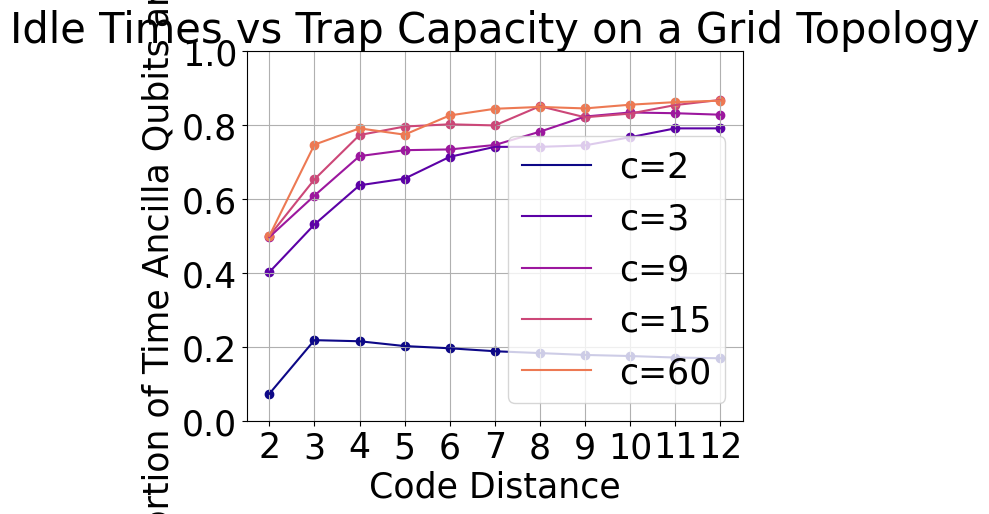

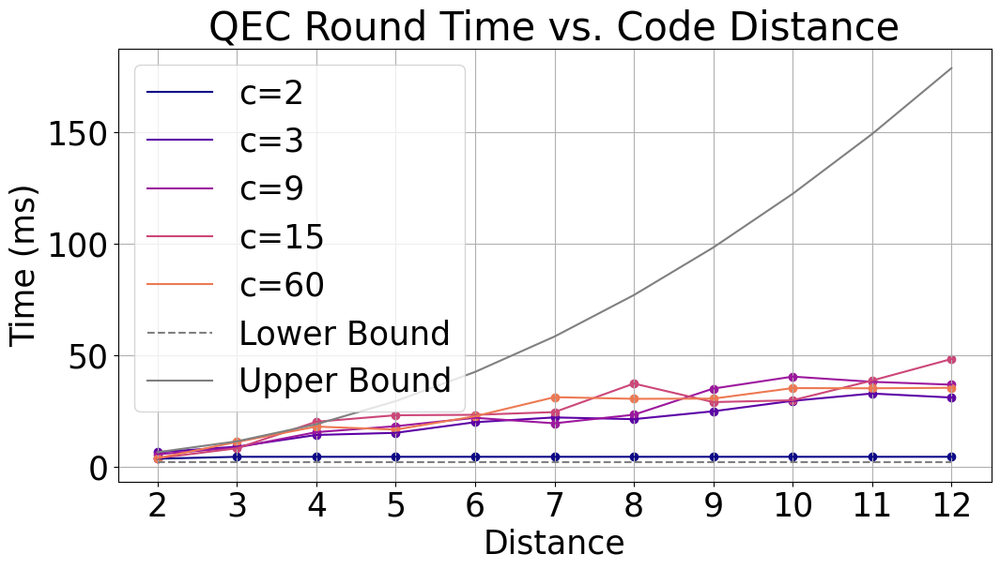

In [416]:
_capacities = [2,3,9,15,60,120]
_distances = distances
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_capacities)+1))
colors = [mplcolors.to_hex(c) for c in colors]
label="Forwarding"
iLabel = 0
fig5, ax5 = plt.subplots()
for i, c in enumerate(_capacities[:-1]):
    if c in _capacities:
        ax5.plot(_distances, [1-round(data["MeanConcurrency"][label][d][i]/(d**2-1), 3) for d in _distances], c=colors[_capacities.index(c)], linestyle=("dashed" if iLabel==1 else "solid"), label=f"c={c}")
        ax5.scatter(_distances, [1-round(data["MeanConcurrency"][label][d][i]/(d**2-1), 3) for d in _distances], c=colors[_capacities.index(c)], marker=("v" if iLabel==1 else "o"))

ax5.legend()
ax5.set_title('Idle Times vs Trap Capacity on a Grid Topology')
ax5.set_xticks(_distances)
ax5.set_xlabel('Code Distance')
ax5.set_ylabel('Proportion of Time Ancilla Qubits are Idling')
ax5.grid(which='major')
ax5.set_yticks([0.0,0.2,0.4,0.6,0.8,1.0])
ax5.set_ylim(0,1)

fig4, ax4 = plt.subplots()
for i, c in enumerate(_capacities[:-1]):
     if c in _capacities:
        ax4.plot(_distances, [data["ElapsedTime"][label][d][i]*1e3 for d in _distances], c=colors[_capacities.index(c)], linestyle=("dashed" if iLabel==1 else "solid"),label=f"c={c}")
        ax4.scatter(_distances, [data["ElapsedTime"][label][d][i]*1e3 for d in _distances], c=colors[_capacities.index(c)], marker=("v" if iLabel==1 else "o"))

ax4.plot(_distances, [2230/1e3 for d in _distances], c='grey', linestyle=("dashed"),label=f"Lower Bound")
ax4.plot(_distances, [max(data["ElapsedTime"][label][2][i] for i,c in enumerate(capacities))*1e3+ps_hat[0]*(d-2)+ps_hat[1]*(d-2)**2 for d in _distances], c='grey', linestyle=("solid"),label=f"Upper Bound")
# ax4.scatter([d for d in _distances if d<=7], [max(data["ElapsedTime"][label][d][i]*1e3 for i,c in enumerate(capacities)) for d in _distances if d<=7], marker=("v" if iLabel==1 else "o"), c='grey')
ax4.legend()
ax4.set_title('QEC Round Time vs. Code Distance')
ax4.set_xlabel('Distance')
ax4.set_xticks(_distances)
# ax4.set_xlim(2,18)
# fig4.set_size_inches(1)

ax4.set_ylabel('Time (ms)')
ax4.grid(which='major')

fig4.set_size_inches(12, 6)

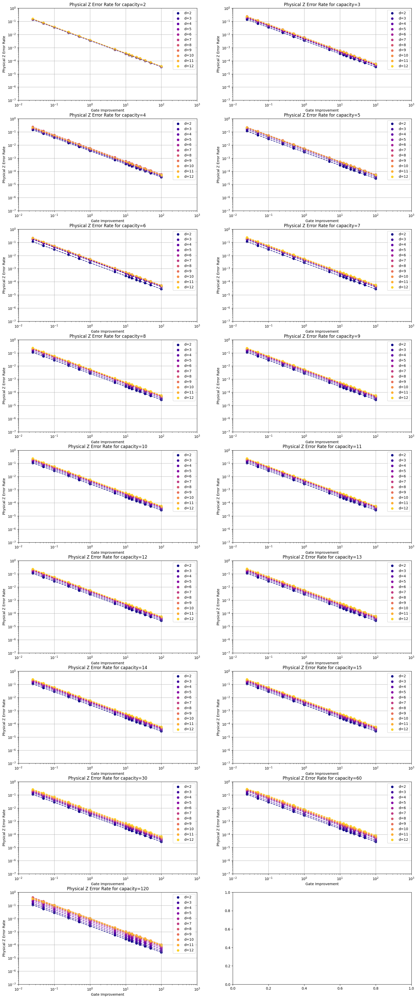

In [16]:
_capacities = capacities
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(distances)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs1 = plt.subplots(int(len(_capacities)/2)+1,2)
axs1=axs1.flatten()
fig1.set_size_inches( 20,50)

for j, (c, ax1) in enumerate(zip(_capacities, axs1)):

    for i,d in enumerate(distances):
        ax1.plot(gate_improvements, data["PhysicalZErrorRates"]["Forwarding"][d][j], linestyle='dashed', c=colors[i])
        ax1.scatter(gate_improvements, data["PhysicalZErrorRates"]["Forwarding"][d][j], c=colors[i], label=f"d={d}")
 
    ax1.legend()
    ax1.set_title(f'Physical Z Error Rate for capacity={c}')
    ax1.set_xlabel('Gate Improvement')
    ax1.set_ylabel('Physical Z Error Rate')
    ax1.set_xlim(1e-2, 1000)
    ax1.set_ylim(1e-7, 1e-0)
    ax1.set_xticks(gate_improvements)
    ax1.loglog()

    ax1.grid(which='major')



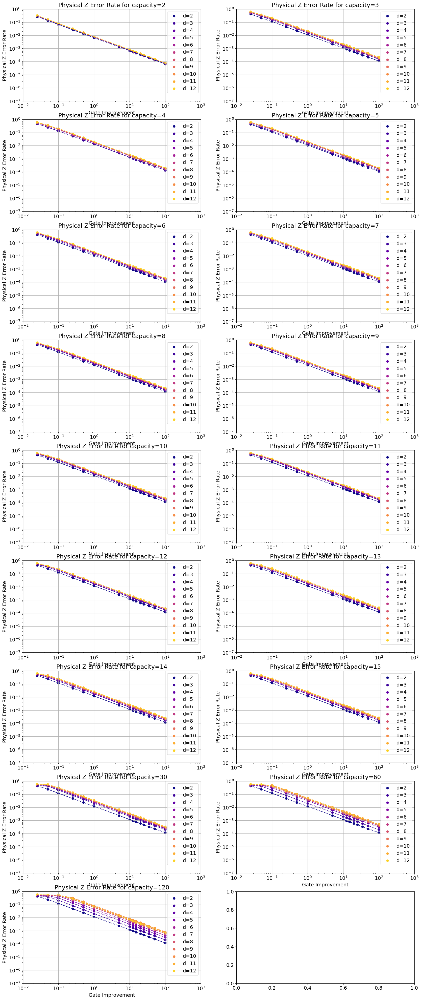

In [312]:
_capacities = capacities
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(distances)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs1 = plt.subplots(int(len(_capacities)/2)+1,2)
axs1=axs1.flatten()
fig1.set_size_inches( 20,50)

for j, (c, ax1) in enumerate(zip(_capacities, axs1)):

    for i,d in enumerate(distances):
        ax1.plot(gate_improvements, grid_data["PhysicalZErrorRates"]["Forwarding"][d][j], linestyle='dashed', c=colors[i])
        ax1.scatter(gate_improvements, grid_data["PhysicalZErrorRates"]["Forwarding"][d][j], c=colors[i], label=f"d={d}")
 
    ax1.legend()
    ax1.set_title(f'Physical Z Error Rate for capacity={c}')
    ax1.set_xlabel('Gate Improvement')
    ax1.set_ylabel('Physical Z Error Rate')
    ax1.set_xlim(1e-2, 1000)
    ax1.set_ylim(1e-7, 1e-0)
    ax1.set_xticks(gate_improvements)
    ax1.loglog()

    ax1.grid(which='major')



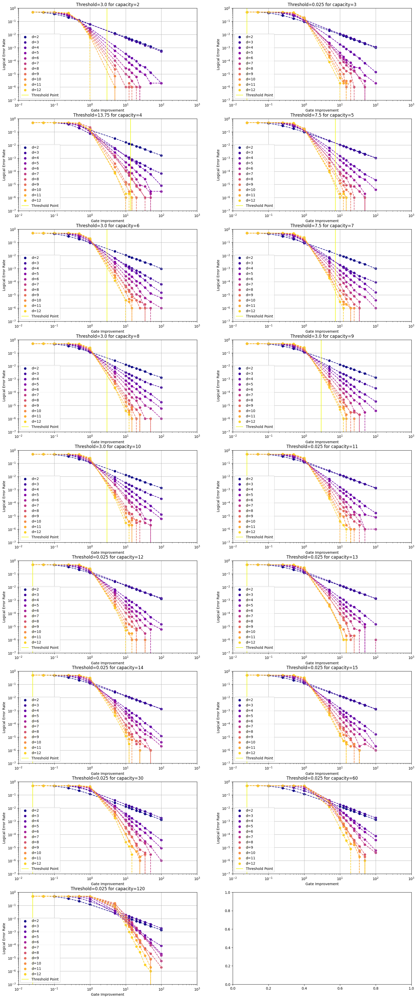

In [163]:
_capacities = capacities
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(distances)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs1 = plt.subplots(int(len(_capacities)/2)+1,2)
axs1=axs1.flatten()
fig1.set_size_inches( 20,50)

thresholds = []
thresholdIdxs = []
for j, (c, ax1) in enumerate(zip(_capacities, axs1)):
    threshold = gate_improvements[0]
    thresholdIdx = 0
    for idx, improv in enumerate(gate_improvements):
        isThreshold = True
        for d1, d2 in zip(distances[:-1], distances[1:]):
            if data["LogicalErrorRates"]["Forwarding"][d1][j][idx]<data["LogicalErrorRates"]["Forwarding"][d2][j][idx]:
                isThreshold = False 
        if isThreshold:
            threshold = (gate_improvements[idx-1]+gate_improvements[idx])/2
            thresholdIdx = idx
            break
    thresholds.append(threshold)
    thresholdIdxs.append(thresholdIdx)

    for i,d in enumerate(distances):
        ax1.plot(gate_improvements, data["LogicalErrorRates"]["Forwarding"][d][j], linestyle='dashed', c=colors[i])
        ax1.scatter(gate_improvements, data["LogicalErrorRates"]["Forwarding"][d][j], c=colors[i], label=f"d={d}")
    
    ax1.vlines([threshold], ymin=[1e-7], ymax=[1e-0], colors=[colors[-1]], label="Threshold Point")
    ax1.legend()
    ax1.set_title(f'Threshold={threshold} for capacity={c}')
    ax1.set_xlabel('Gate Improvement')
    ax1.set_ylabel('Logical Error Rate')
    ax1.set_xlim(1e-2, 1000)
    ax1.set_ylim(1e-7, 1e-0)
    ax1.set_xticks(gate_improvements)
    ax1.loglog()

    ax1.grid(which='major')



In [214]:
print(thresholds)
print(thresholdIdxs)

[0.4, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0]
[4, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6]


In [45]:
print(gate_improvements)

[0.025, 0.05, 0.1, 0.25, 0.5, 1.0, 5.0, 10.0, 12.5, 15.0, 20.0, 25.0, 35.0, 50.0, 100.0]


In [226]:
for i in range(len(thresholds)):
    thresholds[i] = 2.0

In [228]:


for i, t in enumerate(thresholds):
    for j, g in enumerate(gate_improvements):
        if g>t:
            break 
    thresholdIdxs[i] = j

In [227]:
thresholds[capacities.index(2)] = 0.75
# thresholds[_capacities.index(3)] = 1

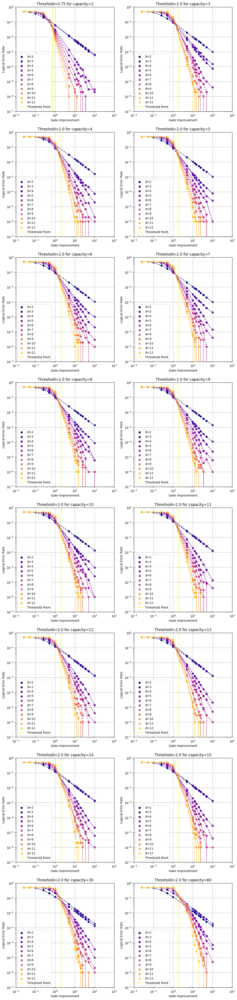

In [229]:
_capacities = capacities
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(distances)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs1 = plt.subplots(int(len(_capacities)/2),2)
axs1=axs1.flatten()
fig1.set_size_inches( 2*fig4.get_size_inches()[0],fig4.get_size_inches()[1]*len(_capacities)/1.4)


for j, (c, ax1) in enumerate(zip(_capacities, axs1)):
    threshold = thresholds[j]
    for i,d in enumerate(distances):
        ax1.plot(gate_improvements, data["LogicalErrorRates"]["Forwarding"][d][j], linestyle='dashed', c=colors[i])
        ax1.scatter(gate_improvements, data["LogicalErrorRates"]["Forwarding"][d][j], c=colors[i], label=f"d={d}")
    
    ax1.vlines([threshold], ymin=[1e-7], ymax=[1e-0], colors=[colors[-1]], label="Threshold Point")
    ax1.legend()
    ax1.set_title(f'Threshold={threshold} for capacity={c}')
    ax1.set_xlabel('Gate Improvement')
    ax1.set_ylabel('Logical Error Rate')
    ax1.set_xlim(1e-2, 1000)
    ax1.set_ylim(1e-7, 1e-0)
    ax1.set_xticks(gate_improvements)
    ax1.loglog()

    ax1.grid(which='major')



In [230]:
_capacities = capacities
def findMaxGi(_j, _d):
    return min(
        [
            u
            for u in range(len(gate_improvements))
            if data["LogicalErrorRates"]["Forwarding"][_d][_j][u] < 1e-6
        ],
        default=len(gate_improvements),
    )



import sklearn.linear_model

fitting_models = {}
errors_squared_for_models = {}
for c in _capacities:


    _model2 = sklearn.linear_model.LinearRegression(fit_intercept=False)


    def _model2paramsfunc(_ds, _xs):
        _ds, _xs = np.array(_ds), np.array(_xs)
        return np.column_stack([np.where(_ds==d,_xs,0) for d in distances]+[np.where(_ds==d,1,0) for d in distances])

    j = _capacities.index(c)
    ys_for_c  = np.log(np.concatenate([
                    [
                        data["LogicalErrorRates"]["Forwarding"][d][j][k + thresholdIdxs[j]]
                        for k in range(
                            len(gate_improvements[thresholdIdxs[j] : findMaxGi(j, d)])
                        )
                    ]
                    for d in distances
                ]))
    xs_for_c = np.log(np.concatenate([gate_improvements[thresholdIdxs[j] : findMaxGi(j, d)] for d in distances]))
    ds_for_c = np.concatenate([[d for _ in gate_improvements[thresholdIdxs[j] : findMaxGi(j, d)]] for d in distances])
    _model2.fit(_model2paramsfunc(ds_for_c, xs_for_c), ys_for_c)

    _model2_errors_squared = (
        ys_for_c
        - _model2.predict(
            _model2paramsfunc(ds_for_c, xs_for_c)
        )
    ) ** 2

    print(np.sqrt(np.mean(_model2_errors_squared)))
    errors_squared_for_models[c]=_model2_errors_squared
    fitting_models[c] = _model2, np.sqrt(np.mean(_model2_errors_squared)), _model2paramsfunc


0.211090594701874
0.18685715013212237
0.31082467024643207
0.2736149800310075
0.23133623731269484
0.22075697537643893
0.28991577180791667
0.31661232518018345
0.25474388190294006
0.22176789219781248
0.16271124945158336
0.20903672319499525
0.22628465859124847
0.26980627623000375
0.12553834758119012
0.1286812203477519
0.17038594090757872


/Users/scottjones_admin/Library/Mobile Documents/com~apple~CloudDocs/Mac files/Repos/PartIIProject/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10917: RuntimeWarning: invalid value encountered in scalar divide
  slope = ssxym / ssxm
/Users/scottjones_admin/Library/Mobile Documents/com~apple~CloudDocs/Mac files/Repos/PartIIProject/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10931: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/Users/scottjones_admin/Library/Mobile Documents/com~apple~CloudDocs/Mac files/Repos/PartIIProject/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10934: RuntimeWarning: invalid value encountered in scalar divide
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)
/Users/scottjones_admin/Library/Mobile Documents/com~apple~CloudDocs/Mac files/Repos/PartIIProject/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10917: RuntimeWarning: invalid value enc

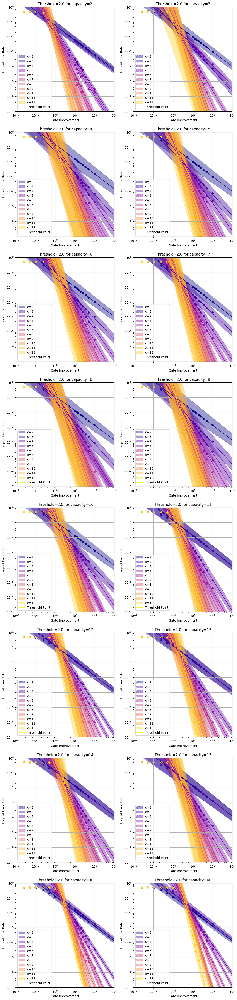

In [231]:

from scipy import stats

cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(distances)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs1 = plt.subplots(int(len(_capacities)/2),2)
axs1=axs1.flatten()
fig1.set_size_inches( 2*fig4.get_size_inches()[0],fig4.get_size_inches()[1]*len(_capacities)/1.4)


fittings_dict = {c: {d: None for d in distances} for c in _capacities}
for j, (c, ax1) in enumerate(zip(_capacities, axs1)):
    for i,d in enumerate(distances):
        xs_for_cd = np.log(gate_improvements[thresholdIdxs[j]:findMaxGi(j,d)])
        if len(xs_for_cd)==0:
            continue
        ys = np.log(data["LogicalErrorRates"]["Forwarding"][d][j][thresholdIdxs[j]:findMaxGi(j,d)])
        _model2, _model2_errors_squared, _model2paramsfunc = fitting_models[c]
        def readout_stat(_rys_drawn, _xs_proj):
            _res = stats.linregress(xs_for_cd, _rys_drawn)
            _alpha_hat, _beta_hat = _res.slope, _res.intercept
            return np.exp(_alpha_hat*(_xs_proj)+_beta_hat)
        
        def ry_star():
            return np.random.normal(loc=_model2.predict(_model2paramsfunc([d]*len(xs_for_cd), xs_for_cd)), scale=_model2_errors_squared)

        xs_projection = np.log(np.array([1e-2, 1000]))
        readouts = np.array([readout_stat(ry_star(), xs_projection) for _ in range(1000)]).T
        los, his = np.quantile(readouts, [0.025,0.975], axis=1)

        ax1.fill_between(np.exp(xs_projection), los, his, color=colors[i], interpolate=True,label=f"d={d}", linestyle="dashed", alpha=0.4)
        ax1.plot(np.exp(xs_projection), np.exp(_model2.predict(_model2paramsfunc([d]*len(xs_projection), xs_projection))), color=colors[i])
        ax1.scatter(gate_improvements, data["LogicalErrorRates"]["Forwarding"][d][j], c=colors[i])
    
    ax1.vlines([thresholds[j]], ymin=[1e-7], ymax=[1e-0], colors=[colors[-1]], label="Threshold Point")
    ax1.legend()
    ax1.set_title(f'Threshold={threshold} for capacity={c}')
    ax1.set_xlabel('Gate Improvement')
    ax1.set_ylabel('Logical Error Rate')
    ax1.set_xlim(1e-2, 1000)
    ax1.set_ylim(1e-7, 1e-0)
    ax1.set_xticks(gate_improvements)
    ax1.loglog()

    ax1.grid(which='major')



/var/folders/wb/b8rfjwj12jn7gld5g0b3c2x80000gn/T/ipykernel_49638/33343638.py:2: RuntimeWarning: overflow encountered in exp
  return np.exp(


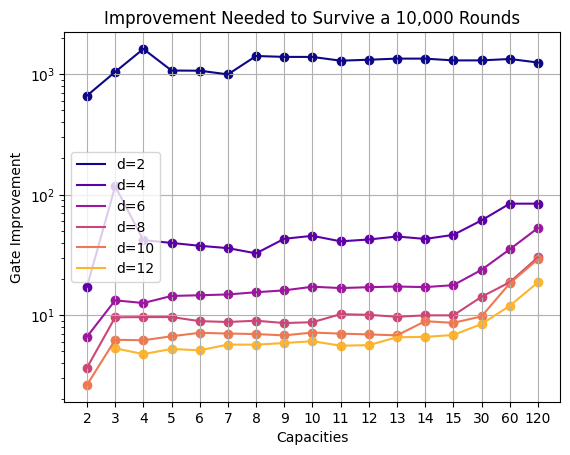

In [232]:
def rootfunc(m, d, y): 
    return np.exp(
            np.divide(
                y - m.coef_[len(distances)+distances.index(d)],
                m.coef_[distances.index(d)]
            )
        )

_distances = [2,4,6,8,10,12]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_distances)+1))
colors = [mplcolors.to_hex(c) for c in colors]

desired_y = np.log(1e-4)

fig1, ax1 = plt.subplots()
for i, d in enumerate(_distances):
    ax1.plot([k for k in range(len(_capacities))], [rootfunc(fitting_models[c][0], d, desired_y) for c in _capacities] , color=colors[i],label=f"d={d}")
    ax1.scatter([k for k in range(len(_capacities))], [rootfunc(fitting_models[c][0], d, desired_y)  for c in _capacities], color=colors[i])
ax1.legend()
ax1.set_title(f'Improvement Needed to Survive a 10,000 Rounds')
ax1.set_xlabel('Capacities')
ax1.set_ylabel('Gate Improvement')

ax1.set_yticks(gate_improvements)
ax1.set_xticks([k for k in range(len(_capacities))])
ax1.set_xticklabels(_capacities)
ax1.set_yscale('log')

ax1.grid(which='major')

/Users/scottjones_admin/Library/Mobile Documents/com~apple~CloudDocs/Mac files/Repos/PartIIProject/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10917: RuntimeWarning: invalid value encountered in scalar divide
  slope = ssxym / ssxm
/Users/scottjones_admin/Library/Mobile Documents/com~apple~CloudDocs/Mac files/Repos/PartIIProject/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10931: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/Users/scottjones_admin/Library/Mobile Documents/com~apple~CloudDocs/Mac files/Repos/PartIIProject/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10934: RuntimeWarning: invalid value encountered in scalar divide
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)
/Users/scottjones_admin/Library/Mobile Documents/com~apple~CloudDocs/Mac files/Repos/PartIIProject/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10917: RuntimeWarning: invalid value enc

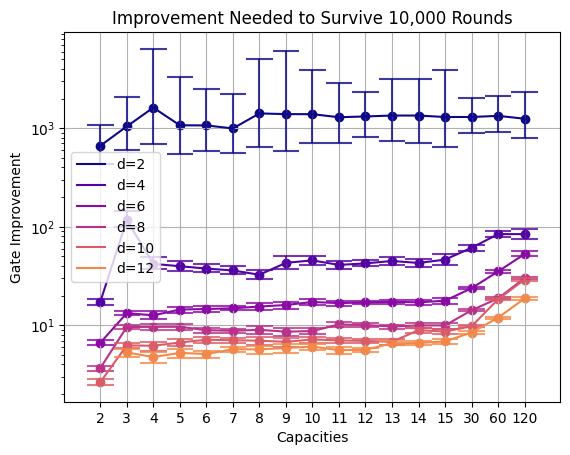

In [271]:
def rootfunc(m, d, y): 
    return np.exp(
            np.divide(
                y - m.coef_[len(distances)+distances.index(d)],
                m.coef_[distances.index(d)]
            )
        )

_capacities = capacities
_distances = [2,4,6,8,10,12]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_distances)+2))
colors = [mplcolors.to_hex(c) for c in colors]
desired_y = np.log(1e-4)
fig1, ax1 = plt.subplots()
for j, d in enumerate(_distances):
    los, his = [], []
    for i,c in enumerate(_capacities):
        xs_for_cd = np.log(gate_improvements[thresholdIdxs[i]:findMaxGi(i,d)])
        if len(xs_for_cd)==0:
            los.append(0)
            his.append(0)
            continue

        _model2, _model2_errors_squared, _model2paramsfunc = fitting_models[c]
        def readout_stat(rys_drawn):
            _res = stats.linregress(xs_for_cd, rys_drawn)
            _alpha_hat, _beta_hat = _res.slope, _res.intercept
            return np.exp((desired_y-_beta_hat)/_alpha_hat)
        
        def ry_star():
            return np.random.normal(loc=_model2.predict(_model2paramsfunc([d]*len(xs_for_cd), xs_for_cd)), scale=_model2_errors_squared)

        readouts = np.array([readout_stat(ry_star()) for _ in range(1000)])
        lo, hi = np.quantile(readouts, [0.025,0.975])
        los.append(lo)
        his.append(hi)   
    ax1.plot([k for k in range(len(_capacities))], [rootfunc(fitting_models[c][0], d, desired_y) for c in _capacities] , color=colors[j],label=f"d={d}")
    ax1.scatter([k for k in range(len(_capacities))], [rootfunc(fitting_models[c][0], d, desired_y) for c in _capacities], color=colors[j])
    ax1.hlines(los+his, xmin=[k-1/2 for k in range(len(_capacities))]*2, xmax=[k+1/2 for k in range(len(_capacities))]*2, colors=[colors[j]]*(len(los)+len(his)), alpha=0.8)
    ax1.vlines([k for k in range(len(_capacities))], ymin=los, ymax=his, colors=[colors[j]]*(len(los)+len(his)), alpha=0.8)
ax1.legend()
ax1.set_title(f'Improvement Needed to Survive 10,000 Rounds')
ax1.set_xlabel('Capacities')
ax1.set_ylabel('Gate Improvement')

ax1.set_xticks([k for k in range(len(_capacities))])
ax1.set_xticklabels(_capacities)
ax1.set_yscale('log')
ax1.grid(which='major')

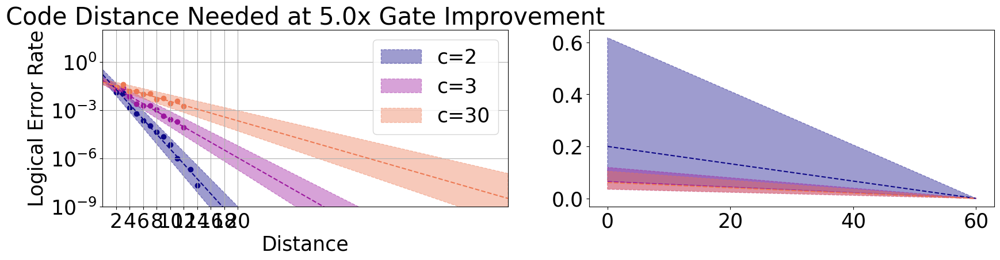

In [433]:
import scipy.stats

_capacities = [2,3,30]
gi_offset = 6
_gate_improvements = gate_improvements[gi_offset:gi_offset+2]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_capacities)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs = plt.subplots(int(len(_gate_improvements)/2),2)
axs=axs.flatten()
fig1.set_size_inches( 20,2*len(_gate_improvements))
xs_projection = np.array([0, 60])

for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    for i, c in enumerate(capacities):
        if c in _capacities:
            logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in distances])
            ds = np.array(distances)
            if c==2 and improv==5:
                logicalErrors = np.concatenate((logicalErrors, [2e-7, 2e-8]), axis=0)
                ds = np.concatenate([ds,[ 13, 14]], axis=0)
            xs, ys = ds[logicalErrors>0], logicalErrors[logicalErrors>0]
            ys = np.log(ys)

            res = scipy.stats.linregress(xs, ys)
            alpha_hat, beta_hat, scale_s_hat, scale_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr
            los, his = (alpha_hat-2*scale_s_hat)*xs_projection+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*xs_projection+(beta_hat+2*scale_i_hat)
            ax.fill_between(xs_projection, np.exp(los), np.exp(his), color=colors[_capacities.index(c)], interpolate=True, label=f"c={c}", linestyle="dashed", alpha=0.4)
            ax.plot(xs_projection,
                np.exp(alpha_hat*xs_projection+beta_hat),
                linestyle='--',
                c=colors[_capacities.index(c)])
            

for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    if j==1:
        continue
    for i, c in enumerate(capacities):     
        if c in _capacities:
            logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in distances])  
            ds = np.array(distances)
            if c==2 and improv==5:
                logicalErrors = np.concatenate((logicalErrors, [2e-7, 2e-8]), axis=0)
                ds = np.concatenate([ds,[ 13, 14]], axis=0)
            xs, ys = ds[logicalErrors>0], logicalErrors[logicalErrors>0] 
            ax.scatter(xs, ys, c=colors[_capacities.index(c)])
            
    ax.legend()
    ax.set_title(f'Code Distance Needed at {improv}x Gate Improvement')
    ax.set_xlabel('Distance')
    ax.set_ylabel('Logical Error Rate')

    ax.set_ylim(1e-9, 1e2)
    ax.set_xlim(*xs_projection)
    ax.set_xticks([2,4,6,8,10,12,14,16,18,20])
    ax.set_yscale('log')

    ax.grid(which='major')

In [20]:
def calculateElectrodes(distance: int, capacity:int) -> int:
    nqubitsNeeded = 2 * distance**2 - 1
    Njz = int(np.ceil(nqubitsNeeded / (2*(capacity-1))) )# 2 traps per junction
    Nlz = nqubitsNeeded-Njz
    Nde = 10*Nlz+20*Njz
    Nse = 10*(Njz+Nlz)

    return Nde+Nse

In [ ]:
data = ...

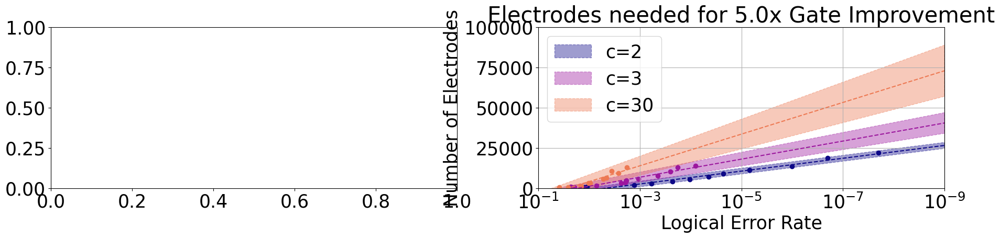

In [431]:
import scipy.stats
import numpy as np
import matplotlib.pyplot as plt

_capacities = [2,3,30]
gi_offset = 5
_gate_improvements = gate_improvements[gi_offset:gi_offset+2]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_capacities)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs = plt.subplots(int(len(_gate_improvements)/2),2)
axs=axs.flatten()
fig1.set_size_inches( 22,2*len(_gate_improvements))
xs_projection = np.array([1e-1, 1e-9])

# unit_change = 30e-3
# unit_change = 50e-3
unit_change=1


for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    if j==0:
        continue
    for i, c in enumerate(capacities):
        if c in _capacities:
            logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in distances])
            electrodes =  np.array([data["DACs"]["Forwarding"][d][i] for d in distances])
            if c==2 and improv==5:
                logicalErrors = np.concatenate((logicalErrors[1:], [2e-7, 2e-8]), axis=0)
                electrodes = np.concatenate([electrodes[1:],[ 18800, 21820]], axis=0)
            ys, xs = electrodes[logicalErrors>0], logicalErrors[logicalErrors>0]
            xs = np.log(xs)
            # ys = np.log(ys)
            res = scipy.stats.linregress(xs, ys)
            alpha_hat, beta_hat, scale_s_hat, scale_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr
            # print(alpha_hat, beta_hat)
            # print(scale_s_hat, scale_i_hat)
            los = np.minimum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
            his = np.maximum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
            ax.fill_between(xs_projection, los*unit_change, his*unit_change, color=colors[_capacities.index(c)], interpolate=True, label=f"c={c}", linestyle="dashed", alpha=0.4)
            ax.plot(xs_projection,
                (alpha_hat*(np.log(xs_projection))+beta_hat)*unit_change,
                linestyle='--',
                c=colors[_capacities.index(c)],
                # label=f"c={c}"
                )
            

for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    if j==0:
        continue
    for i, c in enumerate(capacities):     
        if c in _capacities:
            logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in distances])  
            electrodes =  np.array([data["DACs"]["Forwarding"][d][i] for d in distances])
            if c==2 and improv==5:
                logicalErrors = np.concatenate((logicalErrors, [2e-7, 2e-8]))
                electrodes = np.concatenate([electrodes, [18800, 21820]])
            xs, ys = logicalErrors[logicalErrors>0], electrodes[logicalErrors>0] 
            ax.scatter(xs, ys*unit_change, c=colors[_capacities.index(c)])

    ax.legend()
    ax.set_title(f'Electrodes needed for {improv}x Gate Improvement')
    ax.set_xlabel('Logical Error Rate')
    ax.set_ylabel('Number of Electrodes')

    ax.set_xlim(*xs_projection)
   
   
    ax.set_xscale('log')
    # ax.set_yscale('log')
    ax.set_ylim([0, 1e5])
    # ax.set_yticklabels([round(x, 1) for x in [0, 2e4, 4e4, 6e4, 8e4, 10e4]])

    ax.grid(which='major')

[0.002082 0.003842 0.003222 0.003454 0.003993 0.003814 0.00399  0.003125
 0.003124 0.003161 0.002707 0.002925 0.003205 0.00323  0.002588 0.002287
 0.00208 ]
[4100 3510 3400 3110 3180 3360 3780 3000 3300 3600 2340 2520 2700 2880
 3120 2430 2400]
[0.001059 0.003401 0.002324 0.002105 0.002279 0.002542 0.002455 0.00262
 0.002002 0.001924 0.001825 0.001725 0.00179  0.0018   0.001315 0.001171
 0.001066]
[5500 4710 4000 3900 3840 4400 4960 5520 4160 4540 4440 4780 5120 5460
 3120 2430 2400]
[0.000646 0.002226 0.002732 0.001742 0.001467 0.001469 0.001473 0.001446
 0.00147  0.001195 0.001247 0.001223 0.00121  0.001191 0.000999 0.000823
 0.000677]
[7120 5760 6620 5180 5130 5870 6610 7350 8090 4980 5400 5820 6240 6660
 6210 6120 4830]
[0.000356 0.001058 0.00107  0.001023 0.001122 0.000945 0.001047 0.001024
 0.001054 0.000773 0.000757 0.000746 0.000742 0.000784 0.000555 0.000456
 0.000396]
[9080 7590 6440 7580 6960 6290 7090 7890 8690 6480 7020 5880 6300 6720
 5580 6120 4830]
[0.000216 0.000746 0.

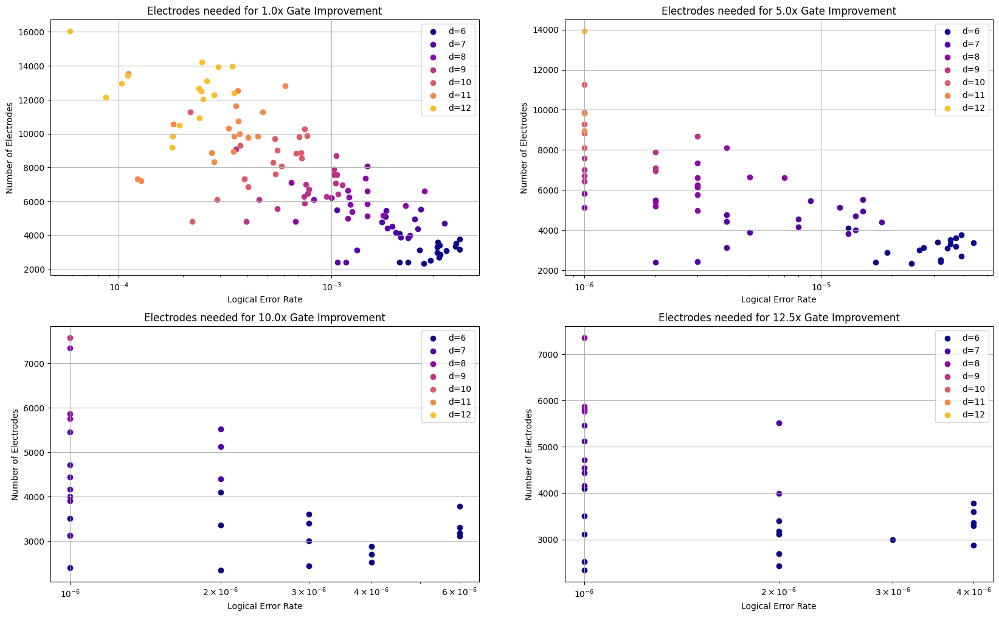

In [20]:
import scipy.stats

_capacities = capacities

_distances = [6,7,8,9,10,11,12]

gi_offset = 5
gi_final_offset = 9
_gate_improvements = gate_improvements[gi_offset:gi_final_offset]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_distances)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs = plt.subplots(int(len(_gate_improvements)/2),2)
axs=axs.flatten()
fig1.set_size_inches( 20,3*len(_gate_improvements))
xs_projection = np.array([1e-1, 1e-9])


# for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
#     logicalErrorsAll = np.array([])
#     electrodesAll = np.array([])

#     for d in _distances:
#         logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for i, c in enumerate(capacities) if c in _capacities])
#         electrodes =  np.array([calculateElectrodes(d,c) for i, c in enumerate(capacities) if c in _capacities])
#         logicalErrorsAll=np.concatenate((logicalErrorsAll, logicalErrors), axis=None)
#         electrodesAll=np.concatenate((electrodesAll, electrodes), axis=None)
#     ys, xs = electrodesAll[logicalErrorsAll>0], logicalErrorsAll[logicalErrorsAll>0]
#     xs = np.log(xs)
#     ys = np.log(ys)

#     res = scipy.stats.linregress(xs, ys)
#     alpha_hat, beta_hat, scale_s_hat, scale_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr
#     # print(alpha_hat, beta_hat)
#     # print(scale_s_hat, scale_i_hat)
#     los = np.minimum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
#     his = np.maximum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
#     # ax.fill_between(xs_projection, np.exp(los), np.exp(his), color=colors[_capacities.index(c)], interpolate=True, label=f"c={c}", linestyle="dashed", alpha=0.4)
#     ax.plot(xs_projection,
#         np.exp(alpha_hat*np.log(xs_projection)+beta_hat),
#         linestyle='--',
#         c='black',
#         # label=f"d={d}"
#         )

                

for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    for d in _distances:
        logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for i, c in enumerate(capacities) if c in _capacities])
        print(logicalErrors)
        electrodes =  np.array([data["Electrodes"]["Forwarding"][d][i] for i, c in enumerate(capacities) if c in _capacities])
        print(electrodes)
        ys, xs = electrodes[logicalErrors>0], logicalErrors[logicalErrors>0]
        ax.scatter(xs,ys, c=colors[_distances.index(d)],label=f"d={d}")
            
    ax.legend()
    ax.set_title(f'Electrodes needed for {improv}x Gate Improvement')
    ax.set_xlabel('Logical Error Rate')
    ax.set_ylabel('Number of Electrodes')

    # ax.set_xlim(*xs_projection)
    # ax.set_ylim(1e1, 1e6)
    ax.set_xscale('log')
    # ax.set_yscale('symlog')

    ax.grid(which='major')

In [12]:
print(data)

{'PhysicalZErrorRates': {'Forwarding': {2: [[0.26464402742030124, 0.13232201371015062, 0.06616100685507531, 0.02646440274203013, 0.013232201371015065, 0.0066161006855075324, 0.0013232201371015063, 0.0006616100685507532, 0.0005292880548406027, 0.00044107337903383573, 0.0003308050342753766, 0.00026464402742030135, 0.00018903144815735808, 0.00013232201371015067, 6.616100685507534e-05], [0.41549190939404335, 0.21318073730571732, 0.10913761305769724, 0.04365504522307889, 0.021827522611539446, 0.010913761305769723, 0.002182752261153945, 0.0010913761305769724, 0.0008731009044615776, 0.0007275840870513147, 0.0005456880652884862, 0.0004365504522307888, 0.00031182175159342063, 0.0002182752261153944, 0.0001091376130576972], [0.4464705881335451, 0.23823529406677257, 0.12599724332168383, 0.05039889732867354, 0.02519944866433677, 0.012599724332168384, 0.002519944866433677, 0.0012599724332168385, 0.0010079779465734708, 0.000839981622144559, 0.0006299862166084193, 0.0005039889732867354, 0.000359992123

In [44]:
data = standard_data

/var/folders/wb/b8rfjwj12jn7gld5g0b3c2x80000gn/T/ipykernel_76384/182435941.py:58: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


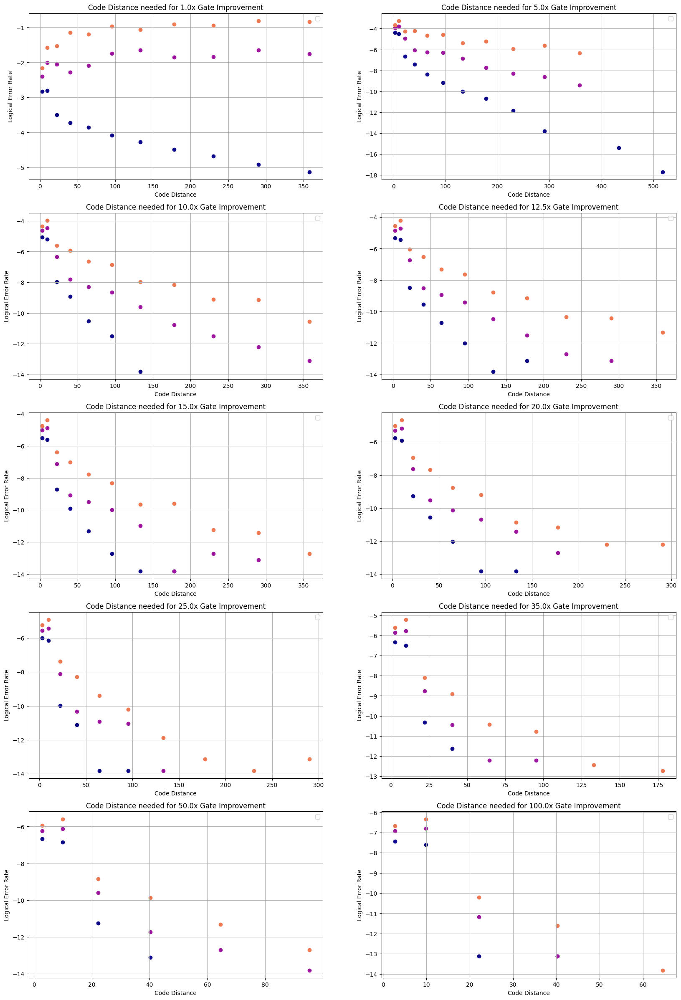

In [59]:
import scipy.stats
import numpy as np
import matplotlib.pyplot as plt

_capacities = [2,3,30]
gi_offset = 5
_gate_improvements = gate_improvements[gi_offset:]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_capacities)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs = plt.subplots(int(len(_gate_improvements)/2),2)
axs=axs.flatten()
fig1.set_size_inches( 20,3*len(_gate_improvements))
xs_projection = np.array([1,20])



# for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
#     for i, c in enumerate(capacities):
#         if c in _capacities:
#             logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in distances])
#             electrodes =  np.array([d for d in distances])
#             if c==2 and improv==5:
#                 logicalErrors = np.concatenate((logicalErrors[1:], [2e-7, 2e-8]), axis=0)
#                 electrodes = np.concatenate([electrodes[1:],[ 13, 14]], axis=0)
#             xs, ys = electrodes[logicalErrors>0], logicalErrors[logicalErrors>0]
#             xs = xs
#             ys = np.log(ys)
#             res = scipy.stats.linregress(xs, ys)
#             alpha_hat, beta_hat, scale_s_hat, scale_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr
#             print(alpha_hat, beta_hat)
#             print(scale_s_hat, scale_i_hat)
#             # los = np.minimum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
#             # his = np.maximum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
#             # ax.fill_between(xs_projection, np.exp(los), np.exp(his), color=colors[_capacities.index(c)], interpolate=True, label=f"c={c}", linestyle="dashed", alpha=0.4)
#             ax.plot(xs_projection,
#                 np.exp(alpha_hat*xs_projection+beta_hat),
#                 linestyle='--',
#                 c=colors[_capacities.index(c)],
#                 # label=f"c={c}"
#                 )
            

for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    for i, c in enumerate(capacities):     
        if c in _capacities:
            logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in distances])  
            electrodes =  np.array([d for d in distances])
            if c==2 and improv==5:
                logicalErrors = np.concatenate((logicalErrors, [2e-7, 2e-8]))
                electrodes = np.concatenate([electrodes, [13, 14]])
            ys, xs = logicalErrors[logicalErrors>0], electrodes[logicalErrors>0] 
            ys = np.log(ys)
            xs = np.log(xs)*xs**2
            ax.scatter(xs, ys, c=colors[_capacities.index(c)])

    ax.legend()
    ax.set_title(f'Code Distance needed for {improv}x Gate Improvement')
    ax.set_ylabel('Logical Error Rate')
    ax.set_xlabel('Code Distance')

    # ax.set_xlim(*xs_projection)
   
    # ax.set_ylim(1e1, 1e6)
    # ax.set_xscale('log')
    # ax.set_yscale('log')
    # ax.set_yticks([0.01,0.1,1,5,10,15,20,50,100,500,1000])

    ax.grid(which='major')

In [144]:
data = standard_data

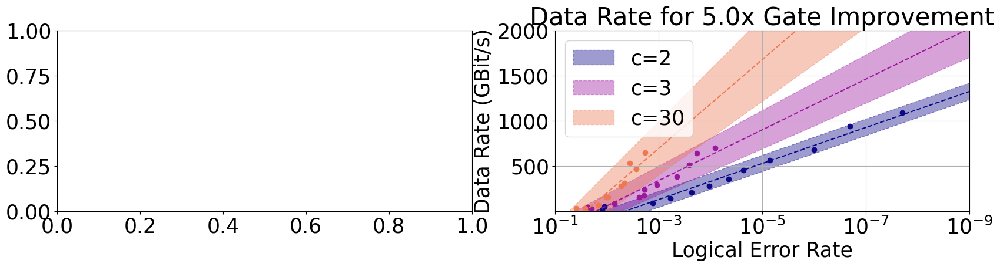

In [428]:
import scipy.stats
import numpy as np
import matplotlib.pyplot as plt

_capacities = [2,3,30]
gi_offset = 5
_gate_improvements = gate_improvements[gi_offset:gi_offset+2]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_capacities)+1))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs = plt.subplots(int(len(_gate_improvements)/2),2)
axs=axs.flatten()
fig1.set_size_inches( 20,2*len(_gate_improvements))
xs_projection = np.array([1e-1, 1e-9])

# unit_change = 30e-3
unit_change = 50e-3


for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    if j==0:
        continue
    for i, c in enumerate(capacities):
        if c in _capacities:
            logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in distances])
            electrodes =  np.array([data["DACs"]["Forwarding"][d][i] for d in distances])
            if c==2 and improv==5:
                logicalErrors = np.concatenate((logicalErrors[1:], [2e-7, 2e-8]), axis=0)
                electrodes = np.concatenate([electrodes[1:],[ 18800, 21820]], axis=0)
            ys, xs = electrodes[logicalErrors>0], logicalErrors[logicalErrors>0]
            xs = np.log(xs)
            res = scipy.stats.linregress(xs, ys)
            alpha_hat, beta_hat, scale_s_hat, scale_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr
            # print(alpha_hat, beta_hat)
            # print(scale_s_hat, scale_i_hat)
            los = np.minimum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
            his = np.maximum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
            ax.fill_between(xs_projection, los*unit_change, his*unit_change, color=colors[_capacities.index(c)], interpolate=True, label=f"c={c}", linestyle="dashed", alpha=0.4)
            ax.plot(xs_projection,
                (alpha_hat*(np.log(xs_projection))+beta_hat)*unit_change,
                linestyle='--',
                c=colors[_capacities.index(c)],
                # label=f"c={c}"
                )
            

for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    if j==0:
        continue
    for i, c in enumerate(capacities):     
        if c in _capacities:
            logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in distances])  
            electrodes =  np.array([data["DACs"]["Forwarding"][d][i] for d in distances])
            if c==2 and improv==5:
                logicalErrors = np.concatenate((logicalErrors, [2e-7, 2e-8]))
                electrodes = np.concatenate([electrodes, [18800, 21820]])
            xs, ys = logicalErrors[logicalErrors>0], electrodes[logicalErrors>0] 
            ax.scatter(xs, ys*unit_change, c=colors[_capacities.index(c)])

    ax.legend()
    ax.set_title(f'Data Rate for {improv}x Gate Improvement')
    ax.set_xlabel('Logical Error Rate')
    ax.set_ylabel('Data Rate (GBit/s)')

    ax.set_xlim(*xs_projection)
   
    ax.set_ylim(1, 2000)
    ax.set_xscale('log')
    # ax.set_yscale('log')
    # ax.set_yticks([0.01,0.1,1,5,10,15,20,50,100,500,1000])

    ax.grid(which='major')

In [21]:
gate_improvements = [0.025, 0.05, 0.1, 0.25, 0.5, 1.0, 5.0, 10.0, 12.5, 15.0, 20.0, 25.0, 35.0, 50.0, 100.0]
distances = [2,3,4,5,6,7,8,9,10,11,12]
capacities = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,30,60,120]

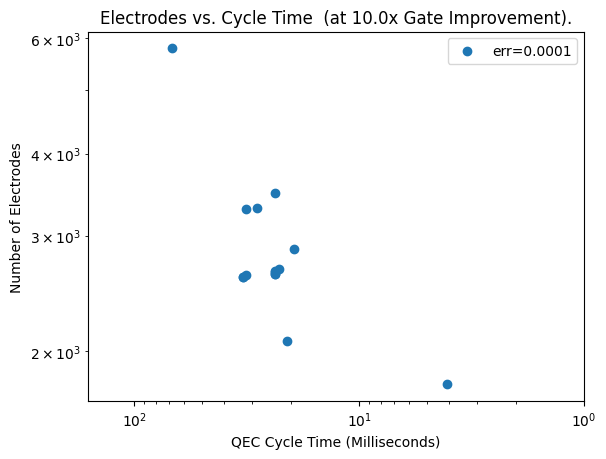

In [113]:
Desired_Logical_error = 1e-9
Gate_Improvement = 10.0
GI_offset = gate_improvements.index(Gate_Improvement)


logical_errors = [1e-4]

fig, ax = plt.subplots()
for Desired_Logical_error in logical_errors:

    trapCapToElectrodes = {}
    trapCapToQECTime = {}
    for i, c in enumerate(capacities):
        logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][GI_offset] for d in distances])  
        electrodes =  np.array([calculateElectrodes(d,c) for d in distances])
        for ne, le, d in zip(electrodes, logicalErrors, distances):
            if le<=Desired_Logical_error:
                trapCapToElectrodes[c]=ne
                trapCapToQECTime[c]=data["ElapsedTime"]["Forwarding"][d][i]*1e3
                break

    ax.scatter([trapCapToQECTime[c] for c in capacities if c in trapCapToQECTime], [trapCapToElectrodes[c] for c in capacities if c in trapCapToQECTime], label=f"err={Desired_Logical_error}")

ax.legend()
ax.set_title(f'Electrodes vs. Cycle Time  (at {Gate_Improvement}x Gate Improvement).')
ax.set_xlabel('QEC Cycle Time (Milliseconds)')
ax.set_ylabel('Number of Electrodes')

# ax.set_xscale('log')
ax.set_xlim(160, 1)
ax.set_yscale('log')
ax.set_xscale('log')


In [ ]:
standard_data = ...

In [ ]:
wise_data = ...

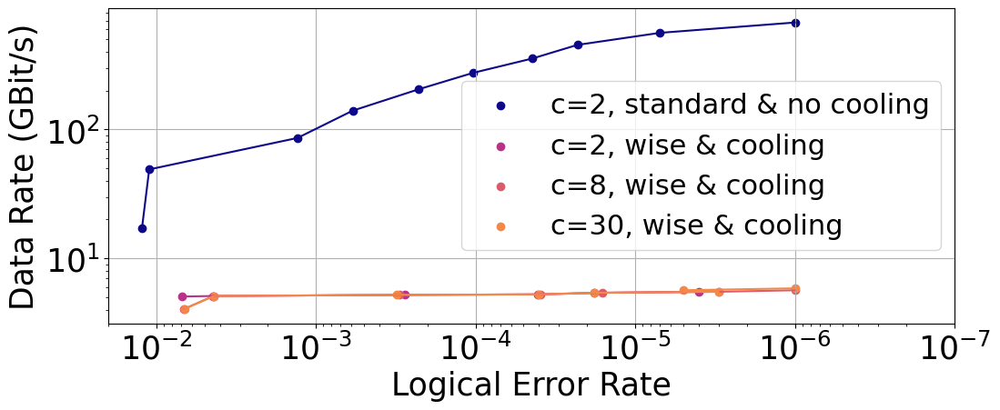

In [454]:
import scipy.stats

_capacities = [2,8,30]
gi_offset = 6
_gate_improvements = gate_improvements[gi_offset:gi_offset+1]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 2*(len(_capacities)+1)))
colors = [mplcolors.to_hex(c) for c in colors]

# fig1, axs = plt.subplots(int(len(_gate_improvements)/2),2)
fig1, ax = plt.subplots(1,1)
axs=[ax]
fig1.set_size_inches( 12,4.5*len(_gate_improvements))
xs_projection = np.array([0.02, 1e-7])

unit_change = 50e-3


# for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
#     for k, (label, data) in enumerate(zip(["standard", "wise"], [standard_data, wise_data])):
#         for i, c in enumerate(capacities):
#             if (c in _capacities and label=="wise") or c==2:
#                 logicalErrors = np.array([   data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in distances])
#                 dacs =  np.array([data["DACs"]["Forwarding"][d][i]*unit_change for d in distances])
#                 if c==2 and improv==5 and label=="standard":
#                     logicalErrors = np.concatenate((logicalErrors[1:], [2e-7, 2e-8]))
#                     dacs = np.concatenate([dacs[1:], [18800*unit_change, 21820*unit_change]])
#                 ys, xs = dacs[logicalErrors>0], logicalErrors[logicalErrors>0]
#                 xs = np.log(xs)
#                 res = scipy.stats.linregress(xs, ys)
#                 alpha_hat, beta_hat, scale_s_hat, scale_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr
#                 los = np.minimum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
#                 his = np.maximum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
#                 ax.fill_between(xs_projection, los, his, color=colors[k*len(_capacities)+_capacities.index(c)], interpolate=True, label=f"c={c}, arch={label}", linestyle="dashed", alpha=0.4)
#                 ax.plot(xs_projection,
#                     alpha_hat*np.log(xs_projection)+beta_hat,
#                     linestyle='--',
#                     c=colors[k*len(_capacities)+_capacities.index(c)],
#                     # label=f"c={c}, arch={label}"
#                     )
            

    

for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):

    for k, (label, data) in enumerate(zip(["standard & no cooling", "wise & cooling"], [standard_data, wise_data])):
        for i, c in enumerate(capacities):     
            if (c in _capacities and ("wise" in label)) or c==2:
                logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in distances])  
                dacs =  np.array([data["DACs"]["Forwarding"][d][i]*unit_change for d in distances])
                if c==2 and improv==5 and label=="standard":
                    logicalErrors = np.concatenate((logicalErrors, [2e-7, 2e-8]))
                    dacs = np.concatenate([dacs, [18800*unit_change, 21820*unit_change]])
                ys, xs = dacs[logicalErrors>0], logicalErrors[logicalErrors>0]
                ax.plot(xs, ys, c=colors[k*len(_capacities)+_capacities.index(c)])
                ax.scatter(xs, ys, c=colors[k*len(_capacities)+_capacities.index(c)], 
                           label=f"c={c}, {label}",
                           )

    if k==1:     
        ax.legend(prop={'size':22})
        # ax.set_title(f'Standard vs. Wise for {improv}x Gate Improvement')
        ax.set_xlabel('Logical Error Rate')
        ax.set_ylabel('Data Rate (GBit/s)')

        ax.set_xlim(*xs_projection)
        ax.set_xscale('log')
        ax.set_yscale('log')
        # ax.set_ylim(0, 1000)

        ax.grid(which='major')

In [427]:



for k1 in data.keys():
    for k2 in data[k1].keys():
        for k3 in data[k1][k2].keys():
            data[k1][k2][k3] = [data[k1][k2][k3][c] for c in capacities]


data: Dict[str, Dict[str, Dict[int, Dict[int, Any]]]]


In [121]:
print(_distances)

[3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


In [403]:
plt.rcParams.update({'font.size': 25})

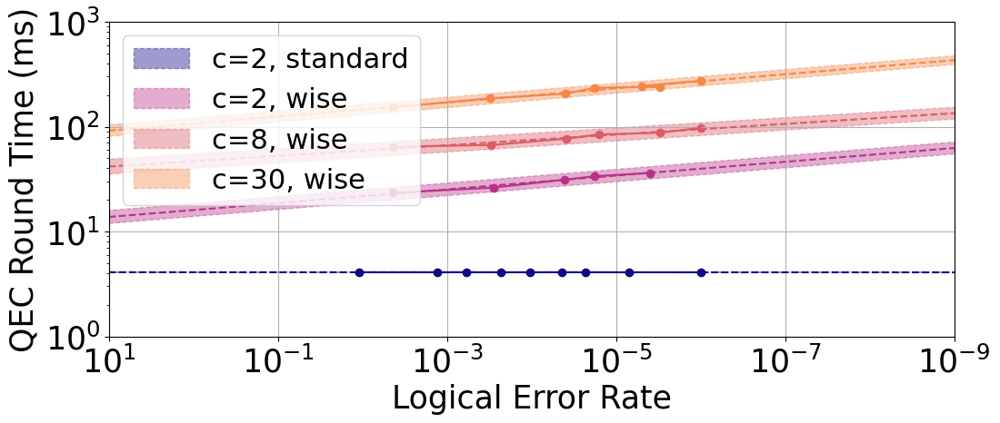

In [451]:
import scipy.stats

_capacities = [2,8,30]
_distances = distances[1:]
gi_offset = 6
_gate_improvements = gate_improvements[gi_offset:gi_offset+1]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 2*(len(_capacities)+1)))
colors = [mplcolors.to_hex(c) for c in colors]

# fig1, axs = plt.subplots(int(len(_gate_improvements)/2),2)
fig1, ax = plt.subplots(1,1)
axs = [ax]
# axs=axs.flatten()
fig1.set_size_inches( 12,4.5*len(_gate_improvements))
xs_projection = np.array([10, 1e-9])

unit_change = 1e3


for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    for k, (label, data) in enumerate(zip(["standard", "wise"], [standard_data, wise_data])):
        for i, c in enumerate(capacities):
            if (c in _capacities and ("wise" in label)) or c==2:
                
                logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in _distances])
                dacs =  np.array([data["ElapsedTime"]["Forwarding"][d][i]*unit_change for d in _distances])
                ys, xs = dacs[logicalErrors>0], logicalErrors[logicalErrors>0]
                xs = np.log(xs)
                ys = np.log(ys)
                res = scipy.stats.linregress(xs, ys)
                alpha_hat, beta_hat, scale_s_hat, scale_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr
                los = np.minimum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
                his = np.maximum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
                ax.fill_between(xs_projection, np.exp(los), np.exp(his), color=colors[k*len(_capacities)+_capacities.index(c)], interpolate=True, label=f"c={c}, {label}", linestyle="dashed", alpha=0.4)
                ax.plot(xs_projection,
                    np.exp(alpha_hat*np.log(xs_projection)+beta_hat),
                    linestyle='--',
                    c=colors[k*len(_capacities)+_capacities.index(c)],
                    # label=f"c={c}, arch={label}"
                    )
            

    

for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    for k, (label, data) in enumerate(zip(["standard", "wise"], [standard_data, wise_data])):
        for i, c in enumerate(capacities):     
            if (c in _capacities and ("wise" in label)) or c==2:

                logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in _distances])  
                dacs =  np.array([data["ElapsedTime"]["Forwarding"][d][i]*unit_change for d in _distances])
                ys, xs = dacs[logicalErrors>0], logicalErrors[logicalErrors>0]
                ax.plot(xs, ys, c=colors[k*len(_capacities)+_capacities.index(c)])
                ax.scatter(xs, ys, c=colors[k*len(_capacities)+_capacities.index(c)], 
                        #    label=f"c={c}, arch={label}",
                           )

    if k==1:     
        ax.legend(prop={'size':22}, loc='upper left')
        # ax.set_title(f'Standard vs. Wise for {improv}x Gate Improvement')
        ax.set_xlabel('Logical Error Rate')
        ax.set_ylabel('QEC Round Time (ms)')

        ax.set_xlim(*xs_projection)
        
        ax.set_xscale('log')
        ax.set_yscale('log')
        ax.set_ylim([1.0, 1000.0])
        # ax.set_yticks([1.0, 4.0, 10.0, 70.0, 1000.0])

        ax.grid(which='major')

I expect a logical error rate of about 10^(-7) for distance 13 code, so nruns should exhibit a logical error for n=2.

In [1]:
from src.simulator.qccd_circuit import process_circuit

logicalerrrate = 0.0
nruns = 100
for i in range(nruns):
    resultd13c2 = process_circuit(13, 2, gate_improvements=[5.0],num_shots=int(5e6))
    logicalerrrate += resultd13c2['LogicalErrorRates']['Forwarding'][0]
logicalerrrate /= nruns
logicalerrrate

KeyboardInterrupt: 

In [39]:
resultd13c2

{'ElapsedTime': {'Forwarding': 0.004085000000000001},
 'Operations': {'Forwarding': 11786},
 'MeanConcurrency': {'Forwarding': 142.78181818181818},
 'QubitOperations': {'Forwarding': 4298},
 'LogicalErrorRates': {'Forwarding': [2e-07]},
 'PhysicalZErrorRates': {'Forwarding': [0.0014682998796962958]},
 'PhysicalXErrorRates': {'Forwarding': [0.0013316473354717051]},
 'Electrodes': {'Forwarding': 18880},
 'DACs': {'Forwarding': 18880},
 'Capacity': 2,
 'Distance': 13}

In [40]:
from src.simulator.qccd_circuit import process_circuit

logicalerrrate = 0.0
nruns = 10000
for i in range(nruns):
    resultd14c2 = process_circuit(14, 2, gate_improvements=[5.0],num_shots=int(5e6))
    logicalerrrate += resultd14c2['LogicalErrorRates']['Forwarding'][0]
logicalerrrate /= nruns
logicalerrrate

KeyboardInterrupt: 

In [41]:
print(i)
print(resultd14c2)
print(logicalerrrate/i)

10
{'ElapsedTime': {'Forwarding': 0.004085000000000001}, 'Operations': {'Forwarding': 13745}, 'MeanConcurrency': {'Forwarding': 165.7030303030303}, 'QubitOperations': {'Forwarding': 5009}, 'LogicalErrorRates': {'Forwarding': [0.0]}, 'PhysicalZErrorRates': {'Forwarding': [0.0014703003709822114]}, 'PhysicalXErrorRates': {'Forwarding': [0.0013334022997717947]}, 'Electrodes': {'Forwarding': 21820}, 'DACs': {'Forwarding': 21820}, 'Capacity': 2, 'Distance': 14}
2e-08


In [ ]:
resultd14c2 = process_circuit(14, 2, gate_improvements=[5.0],num_shots=int(10e6))

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x107409510>>
Traceback (most recent call last):
  File "/Users/scottjones_admin/Library/Mobile Documents/com~apple~CloudDocs/Mac files/Repos/PartIIProject/venv/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


KeyboardInterrupt: 

In [217]:
print(grid_data["DACs"]["Forwarding"][7][2])

5500


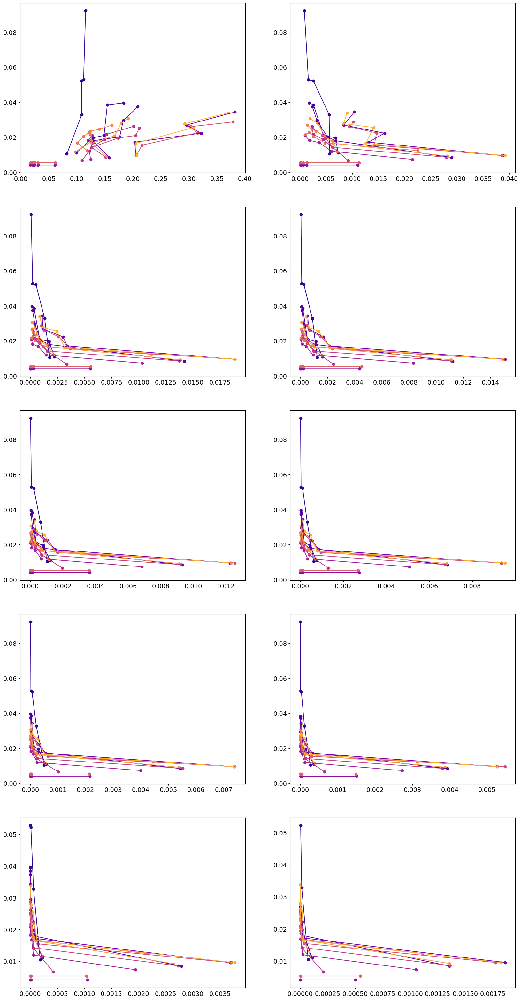

In [184]:
import scipy.stats

_capacities = [2,5,10,15,30]
_distances = distances[1:6]
gi_offset = 5
_gate_improvements = gate_improvements[gi_offset:]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, 3*(len(_capacities)+1)))
colors = [mplcolors.to_hex(c) for c in colors]

fig1, axs = plt.subplots(int(len(_gate_improvements)/2),2)
axs=axs.flatten()
fig1.set_size_inches( 20,4*len(_gate_improvements))
xs_projection = np.array([1, 1e-9])



# for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
#     for k, (label, data) in enumerate(zip(["linear", "grid", "switch"], [linear_data, standard_data, switch_data])):
#         for i, c in enumerate(capacities):
#             if c in _capacities:
#                 if c==2 and label=="linear":
#                     continue
#                 logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in _distances])
#                 elapsedTime =  np.array([data["ElapsedTime"]["Forwarding"][d][i]*unit_change for d in _distances])
#                 ys, xs = elapsedTime[logicalErrors>0], logicalErrors[logicalErrors>0]
#                 xs = np.log(xs)
#                 ys = np.log(ys)
#                 res = scipy.stats.linregress(xs, ys)
#                 alpha_hat, beta_hat, scale_s_hat, scale_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr
#                 los = np.minimum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
#                 his = np.maximum((alpha_hat-2*scale_s_hat)*np.log(xs_projection)+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*np.log(xs_projection)+(beta_hat+2*scale_i_hat))
#                 ax.fill_between(xs_projection, np.exp(los), np.exp(his), color=colors[k*len(_capacities)+_capacities.index(c)], interpolate=True, label=f"c={c}, {label}", linestyle="dashed", alpha=0.4)
#                 ax.plot(xs_projection,
#                     np.exp(alpha_hat*np.log(xs_projection)+beta_hat),
#                     linestyle='--',
#                     c=colors[k*len(_capacities)+_capacities.index(c)],
#                     # label=f"c={c}, arch={label}"
#                     )
            

    

for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
    for k, (label, data) in enumerate(zip(["linear", "grid", "switch"], [linear_data, standard_data, switch_data])):
        for i, c in enumerate(capacities):     
            if c in _capacities:
                if c==2 and label=="linear":
                    continue
                logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in _distances])  
                elapsedTime =  np.array([data["ElapsedTime"]["Forwarding"][d][i]*unit_change for d in _distances])
                ys, xs = elapsedTime[logicalErrors>0], logicalErrors[logicalErrors>0]
                ax.plot(xs, ys, c=colors[k*len(_capacities)+_capacities.index(c)])
                ax.scatter(xs, ys, c=colors[k*len(_capacities)+_capacities.index(c)], 
                        #    label=f"c={c}, arch={label}",
                           )

    if k==1:     
        ax.legend()
        ax.set_title(f'Effect of Communication Topology for {improv}x Gate Improvement')
        ax.set_xlabel('Logical Error Rate')
        ax.set_ylabel('Time for One QEC Shot (ms)')

        ax.set_xlim(*xs_projection)
        
        # ax.set_xscale('log')
        # ax.set_yscale('log')
        # ax.set_ylim([1.0, 1000.0])
        # ax.set_yticks([1.0, 4.0, 10.0, 70.0, 1000.0])

        ax.grid(which='major')

In [374]:



for k1 in switch_data.keys():
    for k2 in switch_data[k1].keys():
        for k3 in switch_data[k1][k2].keys():
            switch_data[k1][k2][k3] = [switch_data[k1][k2][k3][c] for c in capacities]


switch_data: Dict[str, Dict[str, Dict[int, Dict[int, Any]]]]


/var/folders/wb/b8rfjwj12jn7gld5g0b3c2x80000gn/T/ipykernel_76384/1352691820.py:80: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(prop={'size':22})


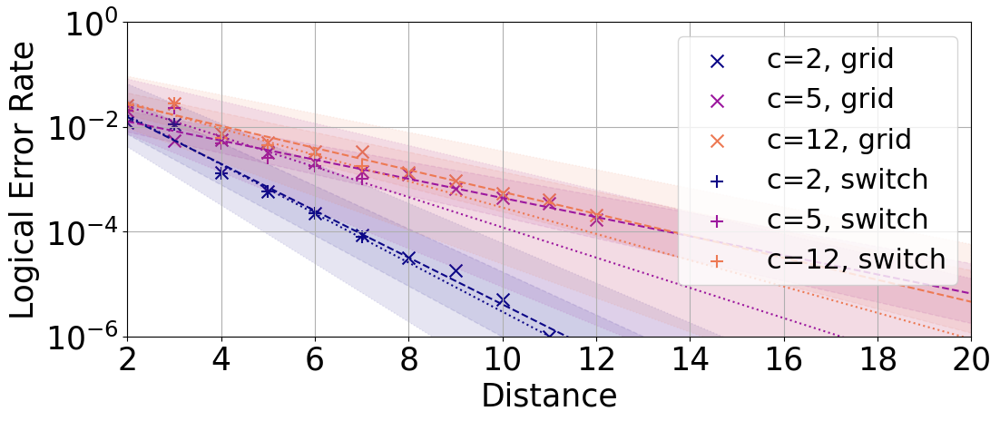

In [444]:
import scipy.stats
_capacities = [2,5,12]
gi_offset = 6
_gate_improvements = gate_improvements[gi_offset:gi_offset+1]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_capacities)+1))
colors = [mplcolors.to_hex(c) for c in colors]

# fig1, axs = plt.subplots(int(len(_gate_improvements)/2),2)
# axs=axs.flatten()
fig1, ax = plt.subplots(1,1)
axs=[ax]
fig1.set_size_inches( 12,4.5*len(_gate_improvements))
xs_projection = np.array([2, 20])

# for k, (label, data) in enumerate(zip(("linear", "grid", "switch"), (linear_data, grid_data, switch_data))):
#     if k<=1:
#         _distances = [2,3,4,5,6,7,8,9,10,11,12]
#     else:
#         _distances = [2,3,4,5,6,7]
#     for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
#         linestyle = ("dashed", "solid", "dotted")[k]
        
#         for i, c in enumerate(capacities):
#             if c in _capacities:
#                 logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in _distances])
#                 ds = np.array(_distances)
#                 xs, ys = ds[logicalErrors>0], logicalErrors[logicalErrors>0]
#                 ys = np.log(ys)
#                 ax.plot(xs, ys, c=colors[3*_capacities.index(c)+k], linestyle=linestyle, label=f"c={c}, {label}")

#                 res = scipy.stats.linregress(xs, ys)
#                 alpha_hat, beta_hat, scale_s_hat, scale_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr
#                 los, his = (alpha_hat-2*scale_s_hat)*xs_projection+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*xs_projection+(beta_hat+2*scale_i_hat)
#                 # ax.fill_between(xs_projection, np.exp(los), np.exp(his), color=colors[3*_capacities.index(c)+k], interpolate=True, linestyle=linestyle, alpha=0.1)
#                 # ax.plot(xs_projection,
#                 #     np.exp(alpha_hat*xs_projection+beta_hat),
#                 #     linestyle=linestyle,
#                 #     label=f"c={c}, {label}",
#                 #     c=colors[3*_capacities.index(c)+k])

_distances = [2,3,4,5,6,7]
           
for k, (label, data) in enumerate(zip(("linear", "grid", "switch"), (linear_data, grid_data, switch_data))):
    if k<=1:
        _distances = [2,3,4,5,6,7,8,9,10,11,12]
    else:
        _distances = [2,3,4,5,6,7]
 
    for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
        dotstyle = (".", "x", "+")[k]
        linestyle = ("dashdot", "dashed", "dotted")[k]
        for i, c in enumerate(capacities):     
            if c in _capacities:
                if k==0:
                    continue
                # if k==0 and c==2:
                #     _distances = [2,3,4,5]
                # else:
                #     _distances = [2,3,4,5,6,7]
           
                logicalErrors = np.array([data["LogicalErrorRates"]["Forwarding"][d][i][j+gi_offset] for d in _distances])  
                ds = np.array(_distances)
                xs, ys = ds[logicalErrors>0], logicalErrors[logicalErrors>0] 

                ax.scatter(xs, ys, c=colors[_capacities.index(c)], marker=dotstyle, s=100, label=f"c={c}, {label}")
                # ax.plot(xs, ys, c=colors[_capacities.index(c)], linestyle=linestyle, alpha=0.5)
                ys = np.log(ys)
                res = scipy.stats.linregress(xs, ys)
                alpha_hat, beta_hat, scale_s_hat, scale_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr
                los, his = (alpha_hat-2*scale_s_hat)*xs_projection+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*xs_projection+(beta_hat+2*scale_i_hat)
                ax.fill_between(xs_projection, np.exp(los), np.exp(his), color=colors[_capacities.index(c)], interpolate=True, linestyle=linestyle, alpha=0.1)
                ax.plot(xs_projection,
                    np.exp(alpha_hat*xs_projection+beta_hat),
                    linestyle=linestyle,
                    # label=f"c={c}, {label}",
                    c=colors[_capacities.index(c)])


        ax.legend(prop={'size':22})
        ax.grid(which='major')
        # ax.set_title(f'Topology effect on Logical Error Rate')
        ax.set_xlabel('Distance')
        ax.set_ylabel('Logical Error Rate')

        ax.set_ylim(1e-6, 1)
        ax.set_xlim(*xs_projection)
        # ax.set_xticks([2,3,4,5,6,7,8])
        ax.set_xticks([2,4,6,8,10,12,14,16,18,20])
        ax.set_yscale('log')
        # ax.grid(which='major')

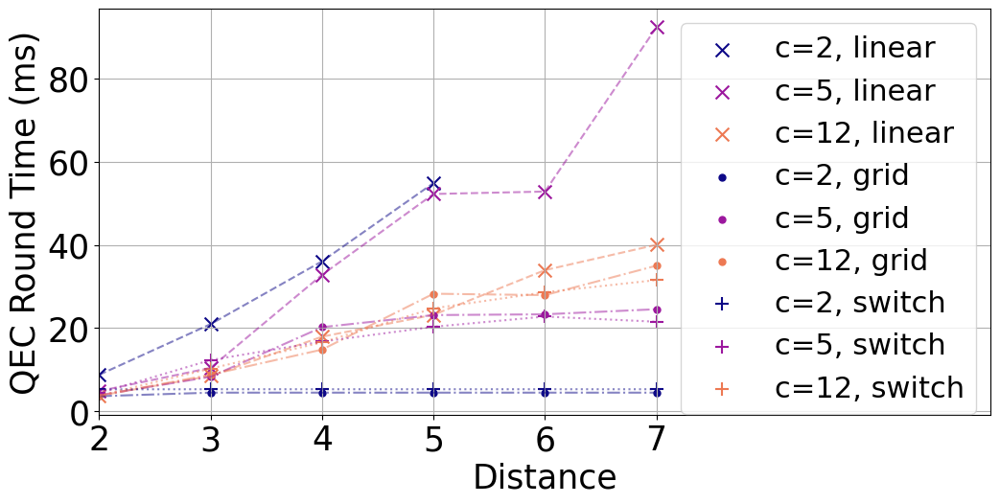

In [443]:
import scipy.stats
_capacities = [2,5,12]
gi_offset = 6
_gate_improvements = gate_improvements[gi_offset:gi_offset+1]
cmap = mpl.colormaps['plasma']
colors = cmap(np.linspace(0, 1, len(_capacities)+1))
colors = [mplcolors.to_hex(c) for c in colors]

# fig1, axs = plt.subplots(int(len(_gate_improvements)/2),2)
# axs=axs.flatten()
fig1, ax = plt.subplots(1,1)
axs = [ax]
fig1.set_size_inches( 12,5.5*len(_gate_improvements))
xs_projection = np.array([2, 10])

# for k, (label, data) in enumerate(zip(("linear", "grid", "switch"), (linear_data, grid_data, switch_data))):
#     if k<=1:
#         _distances = [2,3,4,5,6,7,8,9,10,11,12]
#     else:
#         _distances = [2,3,4,5,6,7]
#     for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
#         linestyle = ("dashed", "solid", "dotted")[k]
        
#         for i, c in enumerate(capacities):
#             if c in _capacities:
#                 elapsedTime = np.array([data["ElapsedTime"]["Forwarding"][d][i][j+gi_offset] for d in _distances])
#                 ds = np.array(_distances)
#                 xs, ys = ds[elapsedTime>0], elapsedTime[elapsedTime>0]
#                 ys = np.log(ys)
#                 ax.plot(xs, ys, c=colors[3*_capacities.index(c)+k], linestyle=linestyle, label=f"c={c}, {label}")

#                 res = scipy.stats.linregress(xs, ys)
#                 alpha_hat, beta_hat, scale_s_hat, scale_i_hat = res.slope, res.intercept, res.stderr, res.intercept_stderr
#                 los, his = (alpha_hat-2*scale_s_hat)*xs_projection+(beta_hat-2*scale_i_hat), (alpha_hat+2*scale_s_hat)*xs_projection+(beta_hat+2*scale_i_hat)
#                 # ax.fill_between(xs_projection, np.exp(los), np.exp(his), color=colors[3*_capacities.index(c)+k], interpolate=True, linestyle=linestyle, alpha=0.1)
#                 # ax.plot(xs_projection,
#                 #     np.exp(alpha_hat*xs_projection+beta_hat),
#                 #     linestyle=linestyle,
#                 #     label=f"c={c}, {label}",
#                 #     c=colors[3*_capacities.index(c)+k])

_distances = [2,3,4,5,6,7]
           
for k, (label, data) in enumerate(zip(("linear", "grid", "switch"), (linear_data, grid_data, switch_data))):
    # if k==0:
    #     _capacities = [3,5,12]
    # else:
    #     _capacities = [2,5,12]
    for j, (improv, ax) in enumerate(zip(_gate_improvements, axs)):
        for i, c in enumerate(capacities):     
            if c in _capacities:
                if k==0 and c==2:
                    _distances = [2,3,4,5]
                else:
                    _distances = [2,3,4,5,6,7]
                dotstyle = ("x", ".", "+")[k]
                linestyle = ("dashed", "dashdot", "dotted")[k]
                elapsedTime = np.array([data["ElapsedTime"]["Forwarding"][d][i] for d in _distances])  
                ds = np.array(_distances)
                xs, ys = ds[elapsedTime>0], elapsedTime[elapsedTime>0] *1e3
                ax.scatter(xs, ys, c=colors[_capacities.index(c)], marker=dotstyle, s=100, label=f"c={c}, {label}")
                ax.plot(xs, ys, c=colors[_capacities.index(c)], linestyle=linestyle, alpha=0.5)

        ax.legend(prop={'size':22})
        # ax.set_title(f'Topology effect on QEC Round Time')
        ax.set_xlabel('Distance')
        ax.set_ylabel('QEC Round Time (ms)')

        ax.set_xlim(*xs_projection)
        ax.set_xticks([2,3,4,5,6,7])
        # ax.set_yscale('log')

        ax.grid(which='major')